<a href="https://colab.research.google.com/github/MarianoChic09/MSc-AI-taller-de-deep-learning/blob/main/TDL2023_Obligatorio_GANs_Entrega.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Taller de Deep Learning
Universidad ORT Uruguay

## Obligatorio

- Mariano Chicatun - N° de Estudiante: 301379

# Generative Adversarial Networks (GANs)

## Teoría

Las GANs son una rama del modelado generativo que usan técnicas de Deep Learning.

El modelado generativo  es una tarea no supervisada de aprendizaje para descubrir y aprender los patrones en los datos de entrada de forma que un modelo pueda usarse para generar como salida nuevas muestras que de forma "plausible" podrían haberse sacado del dataset original.

Las GANs se armar con dos submodelos:
- Un modelo generador que se entrena para generar nuevas muestras
- Un modelo discriminador que intenta clasificar las muestras como real (de la distribución del dataset original) o falsa (generada).

  


Los dos modelos se entrena juntos en un juego de suma cero, como adversarios. Sus funciones de perdida (o su complemento, de recompensa) estan directamente enfrentadas:
- Si el modelo generador genera mejores imagenes y "mejora" su recompensa, entonces al modelo discriminador le va a costar mas distinguir entre imagen verdadera o falsa, y su "recompensa" bajara.
- Si el modelo discriminador modela clasifica mejora las muestras falsas y verdaderas entonces su "recompensa" aumenta y al modelo generador va a tener que mejorar su generación de imagenes para poder mejorar su recompensa.


Las **GANs** son modelos generativos basados en deep learning. Son una arquitectura modelo para entrenar modelos generativos, y lo más común es usar modelos de deep learning en esta arquitectura.
Las GANs se basan en un esceneraio de teoría de juegos, en la cual un red generadora debe competir en contra de un adversario. La red generadora produce las muestras. Su adversario, la red discriminadora, intenta distinguir entre muestras sacadas de los datos de entrenamiento y muestras sacadas del generador.

#### El modelo Generador

El modelo generador toma como entrada un vector de largo fijo con valores aleatorios como entrada y genera una muestra en el dominio. El vector se extrae de forma aleatoria de una distribución Gaussiana, y el vector se usa para ser la semilla del processo generativo.

Una vez entrenado el modelo, los puntos en el espacio multidimensional de vectores va a corresponderse con puntos en el dominio del problema. El espacio de vectores es referido en general como espacio latente. Las variables latentes, u ocultas, son esas variables importantes para el dominio pero que no pueden observarse directmante.


#### El model Discriminador
El modelo discriminador toma una muestra del dominio como entrada (real o generado) y predice una clase binaria: real o falso (generado).

La muestra real vien del dataset de entrenamiento, la muestra generada viene de la salida del modelo generador.

Una vez entrenado se descarta el modelo discriminador porque estamos interesados en el generador.

#### GANs como un juego de dos jugadores

Los dos modelos, el generador y el discriminador, se entrenan juntos. El generador genera un batch de muestras, y estas en conjunto con muestras del dominio se las da al discriminador para clasificar como real o falso.

El discriminador se actualiza para ser mejor en discriminar una imagen real o falsa en la siguiente ronda, y también, el generador se actualiza basandose en que tan bien o mal las muestras generadoras engañaron al discriminador.

De esta forma los dos modelos compiten el uno con el otro, y son adversarios en el sentido de teoría de juegos, y estan jugando un juego de suma cero.

La parte de suma cero significa que cuando el discriminador identifica de manera satisfactoria las muestras reales de las falsas, es recompensado o no hay cambios necesarios en los parametros del modelo, en cambio el generador es penalizado con una gran cantidad de actualizaciones a los parametros del modelo. Viceversa, si el generador engaña al discriminador, es recompensado, es decir que no es necesario hacer cambios en los parametros de la red, pero el discriminador es penalizado y tiene que actualizar los parametros del modelo.

#### GANs y Redes CNN

Como las GAN en general se entrenan con imágenes, se utilizan CNN como modelos generador y discriminador.

La razón de esto es porque las redes CNN son el estado del arte en computer vision, y son las generan los mejores resultados cuando se trata de imágenes. Generan los mejores resultados en detección de objetos y reconocimiento de caras, objetos, etc.


## GAN simple (MLP)

### Carga de datos

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms

import matplotlib.pyplot as plt
import numpy as np

In [ ]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))]) # Normalizo las imagenes

train_dataset = datasets.MNIST(root='./mnist_data/', train=True, transform=transform, download=True)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=64, shuffle=True)


100%|██████████| 9912422/9912422 [00:00<00:00, 100847055.28it/s]

Extracting ./mnist_data/MNIST/raw/train-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 38862911.08it/s]


Extracting ./mnist_data/MNIST/raw/train-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 125807527.41it/s]


Extracting ./mnist_data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 5051850.64it/s]

Extracting ./mnist_data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw



### Modelos Generador y Discriminador

In [ ]:
class Generator(nn.Module):
    """
    El generador toma un vector de ruido y genera una imagen.
    """

    def __init__(self, input_dim, output_dim):
        super(Generator, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.LeakyReLU(0.2),
            nn.Linear(128, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, output_dim),
            nn.Tanh()
        )

    def forward(self, x):
        return self.model(x)


In [ ]:
class Discriminator(nn.Module):
    """
    El discriminador toma una imagen y predice si es real o generada.
    """
    def __init__(self, input_dim):

        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 128),
            nn.LeakyReLU(0.2),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x)


In [ ]:
z_dim = 100 # Dimensiones del espacio latente (vector de ruido)
mnist_dim = train_dataset.train_data.size(1) * train_dataset.train_data.size(2) # Aplano las imagenes MNIST

G = Generator(input_dim=z_dim, output_dim=mnist_dim).cuda()
D = Discriminator(input_dim=mnist_dim).cuda()

criterion = nn.BCELoss()
d_optimizer = optim.Adam(D.parameters(), lr=0.0002)
g_optimizer = optim.Adam(G.parameters(), lr=0.0002)


/usr/local/lib/python3.10/dist-packages/torchvision/datasets/mnist.py:75: UserWarning: train_data has been renamed data
  warnings.warn("train_data has been renamed data")


In [ ]:
def show_generated_images(epoch, generator, z_dim, num_images=10):
    z = torch.randn(num_images, z_dim).cuda()
    with torch.no_grad():  # No necesitamos calcular gradientes aquí
        fake_images = generator(z).view(-1, 28, 28).cpu().data.numpy()

    plt.figure(figsize=(10, 2))
    for i in range(num_images):
        plt.subplot(1, num_images, i+1)
        plt.imshow(fake_images[i], cmap='gray')
        plt.axis('off')
    plt.suptitle(f'Generated Images at Epoch {epoch}')
    plt.show()



### Bucle de entrenamiento

Epoch [0/200], d_loss: 0.3601, g_loss: 3.2767, D(x): 0.89, D(G(z)): 0.10
Epoch [1/200], d_loss: 0.2793, g_loss: 4.2028, D(x): 0.91, D(G(z)): 0.14
Epoch [2/200], d_loss: 0.8076, g_loss: 3.5680, D(x): 0.78, D(G(z)): 0.14
Epoch [3/200], d_loss: 0.3770, g_loss: 2.3585, D(x): 0.95, D(G(z)): 0.25
Epoch [4/200], d_loss: 0.5545, g_loss: 1.8011, D(x): 0.93, D(G(z)): 0.32
Epoch [5/200], d_loss: 0.7259, g_loss: 1.6932, D(x): 0.86, D(G(z)): 0.30
Epoch [6/200], d_loss: 0.8704, g_loss: 1.3530, D(x): 0.70, D(G(z)): 0.22
Epoch [7/200], d_loss: 0.6660, g_loss: 2.5585, D(x): 0.86, D(G(z)): 0.27
Epoch [8/200], d_loss: 0.6766, g_loss: 2.3850, D(x): 0.78, D(G(z)): 0.21


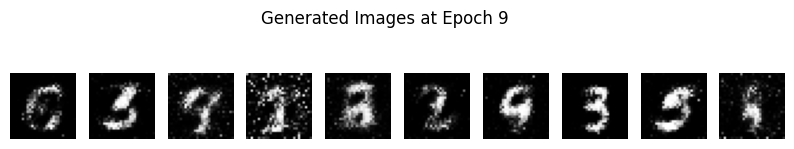

Epoch [9/200], d_loss: 0.8587, g_loss: 2.7797, D(x): 0.80, D(G(z)): 0.29
Epoch [10/200], d_loss: 0.4583, g_loss: 1.8241, D(x): 0.86, D(G(z)): 0.19
Epoch [11/200], d_loss: 0.4959, g_loss: 2.4101, D(x): 0.85, D(G(z)): 0.15
Epoch [12/200], d_loss: 0.4758, g_loss: 1.9072, D(x): 0.82, D(G(z)): 0.17
Epoch [13/200], d_loss: 0.6362, g_loss: 2.1489, D(x): 0.77, D(G(z)): 0.18
Epoch [14/200], d_loss: 0.7808, g_loss: 1.9522, D(x): 0.75, D(G(z)): 0.23
Epoch [15/200], d_loss: 0.7795, g_loss: 3.1791, D(x): 0.70, D(G(z)): 0.20
Epoch [16/200], d_loss: 0.6878, g_loss: 1.4846, D(x): 0.76, D(G(z)): 0.24
Epoch [17/200], d_loss: 0.6814, g_loss: 2.4219, D(x): 0.77, D(G(z)): 0.22
Epoch [18/200], d_loss: 0.6074, g_loss: 2.7686, D(x): 0.75, D(G(z)): 0.16


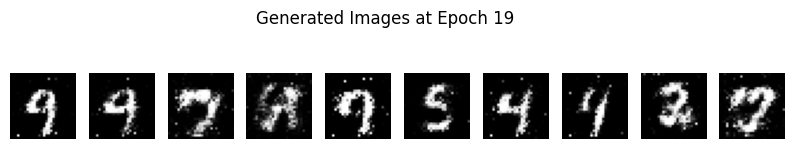

Epoch [19/200], d_loss: 0.6597, g_loss: 2.6927, D(x): 0.79, D(G(z)): 0.25
Epoch [20/200], d_loss: 0.7029, g_loss: 3.2414, D(x): 0.77, D(G(z)): 0.23
Epoch [21/200], d_loss: 0.6782, g_loss: 2.3716, D(x): 0.86, D(G(z)): 0.31
Epoch [22/200], d_loss: 0.8414, g_loss: 2.7165, D(x): 0.85, D(G(z)): 0.36
Epoch [23/200], d_loss: 0.7005, g_loss: 2.0924, D(x): 0.69, D(G(z)): 0.19
Epoch [24/200], d_loss: 0.7250, g_loss: 1.2881, D(x): 0.80, D(G(z)): 0.30
Epoch [25/200], d_loss: 0.7546, g_loss: 2.0490, D(x): 0.76, D(G(z)): 0.25
Epoch [26/200], d_loss: 0.7928, g_loss: 2.7031, D(x): 0.72, D(G(z)): 0.21
Epoch [27/200], d_loss: 1.0951, g_loss: 1.8019, D(x): 0.71, D(G(z)): 0.32
Epoch [28/200], d_loss: 0.6078, g_loss: 1.9070, D(x): 0.82, D(G(z)): 0.26


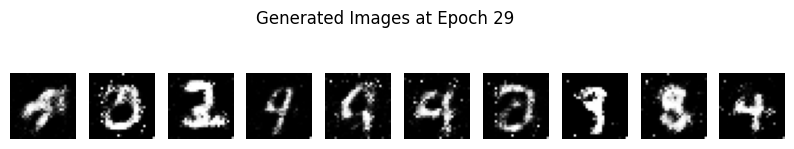

Epoch [29/200], d_loss: 0.5920, g_loss: 2.7486, D(x): 0.81, D(G(z)): 0.25
Epoch [30/200], d_loss: 0.9247, g_loss: 1.3026, D(x): 0.71, D(G(z)): 0.31
Epoch [31/200], d_loss: 0.5188, g_loss: 2.0035, D(x): 0.83, D(G(z)): 0.22
Epoch [32/200], d_loss: 0.7233, g_loss: 1.7133, D(x): 0.70, D(G(z)): 0.17
Epoch [33/200], d_loss: 0.6922, g_loss: 1.9508, D(x): 0.78, D(G(z)): 0.27
Epoch [34/200], d_loss: 0.8240, g_loss: 1.4898, D(x): 0.79, D(G(z)): 0.34
Epoch [35/200], d_loss: 0.7118, g_loss: 2.0932, D(x): 0.67, D(G(z)): 0.14
Epoch [36/200], d_loss: 0.6173, g_loss: 1.9816, D(x): 0.78, D(G(z)): 0.21
Epoch [37/200], d_loss: 0.7327, g_loss: 1.6251, D(x): 0.85, D(G(z)): 0.33
Epoch [38/200], d_loss: 0.9232, g_loss: 1.3660, D(x): 0.73, D(G(z)): 0.33


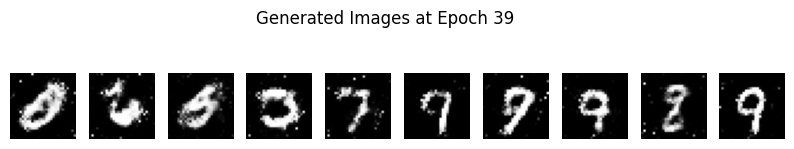

Epoch [39/200], d_loss: 0.7896, g_loss: 2.0119, D(x): 0.77, D(G(z)): 0.26
Epoch [40/200], d_loss: 0.8786, g_loss: 1.7432, D(x): 0.66, D(G(z)): 0.25
Epoch [41/200], d_loss: 0.8102, g_loss: 2.1917, D(x): 0.66, D(G(z)): 0.19
Epoch [42/200], d_loss: 1.0631, g_loss: 1.4971, D(x): 0.74, D(G(z)): 0.31
Epoch [43/200], d_loss: 1.1140, g_loss: 1.4800, D(x): 0.61, D(G(z)): 0.29
Epoch [44/200], d_loss: 0.5713, g_loss: 2.1260, D(x): 0.71, D(G(z)): 0.12
Epoch [45/200], d_loss: 0.7225, g_loss: 2.7470, D(x): 0.73, D(G(z)): 0.24
Epoch [46/200], d_loss: 0.6665, g_loss: 1.8852, D(x): 0.77, D(G(z)): 0.24
Epoch [47/200], d_loss: 0.6692, g_loss: 1.5926, D(x): 0.76, D(G(z)): 0.27
Epoch [48/200], d_loss: 1.1407, g_loss: 2.1206, D(x): 0.65, D(G(z)): 0.27


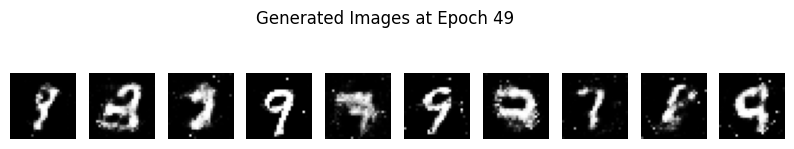

Epoch [49/200], d_loss: 0.6523, g_loss: 1.4654, D(x): 0.78, D(G(z)): 0.24
Epoch [50/200], d_loss: 0.7753, g_loss: 2.2424, D(x): 0.77, D(G(z)): 0.29
Epoch [51/200], d_loss: 1.0394, g_loss: 1.6267, D(x): 0.71, D(G(z)): 0.33
Epoch [52/200], d_loss: 0.7809, g_loss: 1.8842, D(x): 0.78, D(G(z)): 0.33
Epoch [53/200], d_loss: 0.8874, g_loss: 1.8037, D(x): 0.75, D(G(z)): 0.33
Epoch [54/200], d_loss: 0.9318, g_loss: 1.9876, D(x): 0.75, D(G(z)): 0.34
Epoch [55/200], d_loss: 0.7782, g_loss: 1.6801, D(x): 0.66, D(G(z)): 0.20
Epoch [56/200], d_loss: 0.8827, g_loss: 1.7457, D(x): 0.77, D(G(z)): 0.34
Epoch [57/200], d_loss: 0.7598, g_loss: 1.6833, D(x): 0.84, D(G(z)): 0.33
Epoch [58/200], d_loss: 0.8876, g_loss: 2.0719, D(x): 0.66, D(G(z)): 0.18


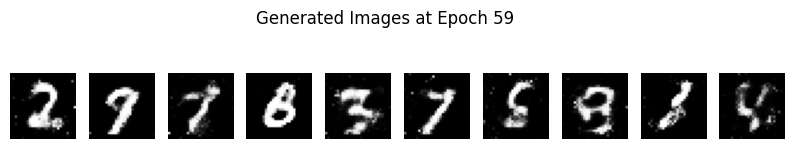

Epoch [59/200], d_loss: 0.6771, g_loss: 1.6062, D(x): 0.73, D(G(z)): 0.23
Epoch [60/200], d_loss: 0.8249, g_loss: 1.2570, D(x): 0.68, D(G(z)): 0.18
Epoch [61/200], d_loss: 0.7196, g_loss: 1.8737, D(x): 0.76, D(G(z)): 0.27
Epoch [62/200], d_loss: 0.7346, g_loss: 2.1208, D(x): 0.72, D(G(z)): 0.21
Epoch [63/200], d_loss: 0.9661, g_loss: 1.7735, D(x): 0.62, D(G(z)): 0.24
Epoch [64/200], d_loss: 0.7290, g_loss: 2.4850, D(x): 0.81, D(G(z)): 0.31
Epoch [65/200], d_loss: 0.7929, g_loss: 1.7097, D(x): 0.66, D(G(z)): 0.16
Epoch [66/200], d_loss: 0.7214, g_loss: 2.0601, D(x): 0.71, D(G(z)): 0.22
Epoch [67/200], d_loss: 0.8863, g_loss: 1.8256, D(x): 0.72, D(G(z)): 0.29
Epoch [68/200], d_loss: 0.7143, g_loss: 1.6779, D(x): 0.74, D(G(z)): 0.25


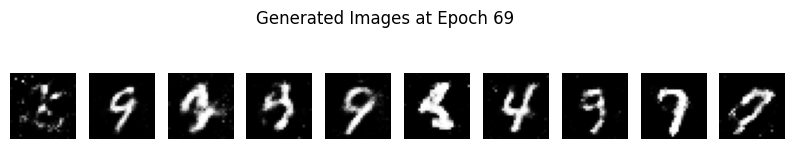

Epoch [69/200], d_loss: 1.0733, g_loss: 1.5983, D(x): 0.72, D(G(z)): 0.40
Epoch [70/200], d_loss: 1.0689, g_loss: 1.3574, D(x): 0.68, D(G(z)): 0.35
Epoch [71/200], d_loss: 0.8094, g_loss: 2.0449, D(x): 0.72, D(G(z)): 0.26
Epoch [72/200], d_loss: 0.8783, g_loss: 1.8927, D(x): 0.69, D(G(z)): 0.25
Epoch [73/200], d_loss: 0.6952, g_loss: 1.5760, D(x): 0.74, D(G(z)): 0.23
Epoch [74/200], d_loss: 0.8902, g_loss: 2.2413, D(x): 0.74, D(G(z)): 0.33
Epoch [75/200], d_loss: 0.7210, g_loss: 1.7637, D(x): 0.75, D(G(z)): 0.23
Epoch [76/200], d_loss: 0.8494, g_loss: 2.1825, D(x): 0.67, D(G(z)): 0.24
Epoch [77/200], d_loss: 0.6705, g_loss: 2.1986, D(x): 0.73, D(G(z)): 0.20
Epoch [78/200], d_loss: 0.7475, g_loss: 2.2484, D(x): 0.80, D(G(z)): 0.31


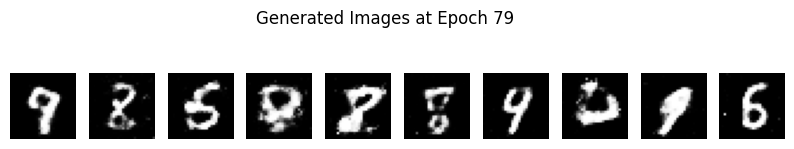

Epoch [79/200], d_loss: 0.8220, g_loss: 1.3494, D(x): 0.66, D(G(z)): 0.24
Epoch [80/200], d_loss: 0.9313, g_loss: 2.2716, D(x): 0.62, D(G(z)): 0.22
Epoch [81/200], d_loss: 0.8296, g_loss: 1.3947, D(x): 0.84, D(G(z)): 0.38
Epoch [82/200], d_loss: 0.8428, g_loss: 1.6113, D(x): 0.74, D(G(z)): 0.30
Epoch [83/200], d_loss: 0.9136, g_loss: 1.4561, D(x): 0.70, D(G(z)): 0.31
Epoch [84/200], d_loss: 0.7754, g_loss: 1.4229, D(x): 0.76, D(G(z)): 0.27
Epoch [85/200], d_loss: 0.6934, g_loss: 1.6960, D(x): 0.76, D(G(z)): 0.27
Epoch [86/200], d_loss: 0.8083, g_loss: 1.4105, D(x): 0.66, D(G(z)): 0.23
Epoch [87/200], d_loss: 0.6818, g_loss: 1.3672, D(x): 0.79, D(G(z)): 0.30
Epoch [88/200], d_loss: 0.8864, g_loss: 1.4434, D(x): 0.67, D(G(z)): 0.27


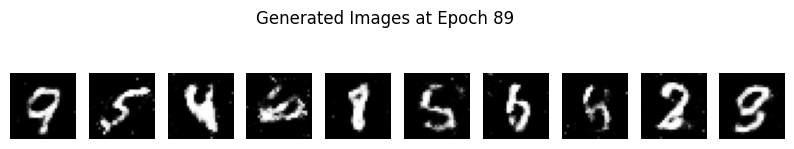

Epoch [89/200], d_loss: 0.8115, g_loss: 1.8703, D(x): 0.74, D(G(z)): 0.33
Epoch [90/200], d_loss: 0.8630, g_loss: 1.7041, D(x): 0.72, D(G(z)): 0.27
Epoch [91/200], d_loss: 0.7089, g_loss: 1.6195, D(x): 0.81, D(G(z)): 0.33
Epoch [92/200], d_loss: 0.7883, g_loss: 1.7312, D(x): 0.73, D(G(z)): 0.25
Epoch [93/200], d_loss: 0.6863, g_loss: 1.9535, D(x): 0.78, D(G(z)): 0.27
Epoch [94/200], d_loss: 0.8953, g_loss: 1.3928, D(x): 0.64, D(G(z)): 0.26
Epoch [95/200], d_loss: 0.8281, g_loss: 2.2729, D(x): 0.69, D(G(z)): 0.26
Epoch [96/200], d_loss: 0.7947, g_loss: 1.3248, D(x): 0.75, D(G(z)): 0.31
Epoch [97/200], d_loss: 1.1111, g_loss: 2.6495, D(x): 0.77, D(G(z)): 0.42
Epoch [98/200], d_loss: 0.8567, g_loss: 1.4876, D(x): 0.72, D(G(z)): 0.29


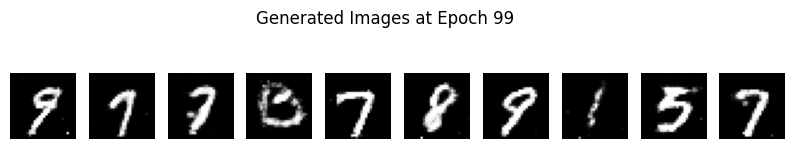

Epoch [99/200], d_loss: 0.7263, g_loss: 1.4855, D(x): 0.69, D(G(z)): 0.21
Epoch [100/200], d_loss: 0.7676, g_loss: 1.4877, D(x): 0.74, D(G(z)): 0.30
Epoch [101/200], d_loss: 0.8570, g_loss: 1.6794, D(x): 0.74, D(G(z)): 0.32
Epoch [102/200], d_loss: 1.0525, g_loss: 2.1136, D(x): 0.68, D(G(z)): 0.33
Epoch [103/200], d_loss: 0.9165, g_loss: 2.1947, D(x): 0.63, D(G(z)): 0.23
Epoch [104/200], d_loss: 0.9712, g_loss: 2.0405, D(x): 0.68, D(G(z)): 0.28
Epoch [105/200], d_loss: 0.8903, g_loss: 1.4990, D(x): 0.62, D(G(z)): 0.21
Epoch [106/200], d_loss: 0.8483, g_loss: 1.4944, D(x): 0.71, D(G(z)): 0.28
Epoch [107/200], d_loss: 0.8882, g_loss: 1.6693, D(x): 0.73, D(G(z)): 0.34
Epoch [108/200], d_loss: 0.8234, g_loss: 1.3233, D(x): 0.78, D(G(z)): 0.33


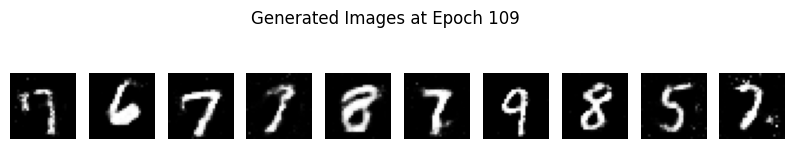

Epoch [109/200], d_loss: 0.9857, g_loss: 1.8002, D(x): 0.63, D(G(z)): 0.24
Epoch [110/200], d_loss: 0.7929, g_loss: 1.7469, D(x): 0.78, D(G(z)): 0.28
Epoch [111/200], d_loss: 0.7910, g_loss: 1.8301, D(x): 0.78, D(G(z)): 0.31
Epoch [112/200], d_loss: 0.8440, g_loss: 1.7809, D(x): 0.88, D(G(z)): 0.42
Epoch [113/200], d_loss: 0.5921, g_loss: 2.3212, D(x): 0.73, D(G(z)): 0.16
Epoch [114/200], d_loss: 0.7581, g_loss: 1.4375, D(x): 0.71, D(G(z)): 0.23
Epoch [115/200], d_loss: 0.9692, g_loss: 1.7300, D(x): 0.74, D(G(z)): 0.38
Epoch [116/200], d_loss: 0.7797, g_loss: 1.6685, D(x): 0.70, D(G(z)): 0.25
Epoch [117/200], d_loss: 0.9755, g_loss: 1.7821, D(x): 0.63, D(G(z)): 0.27
Epoch [118/200], d_loss: 0.8474, g_loss: 2.0133, D(x): 0.74, D(G(z)): 0.25


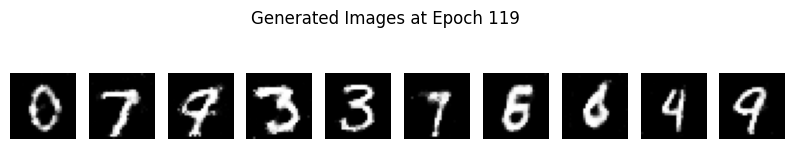

Epoch [119/200], d_loss: 0.7746, g_loss: 2.0975, D(x): 0.74, D(G(z)): 0.27
Epoch [120/200], d_loss: 0.6395, g_loss: 1.7607, D(x): 0.73, D(G(z)): 0.18
Epoch [121/200], d_loss: 0.8981, g_loss: 1.5293, D(x): 0.76, D(G(z)): 0.35
Epoch [122/200], d_loss: 0.8040, g_loss: 1.8938, D(x): 0.70, D(G(z)): 0.21
Epoch [123/200], d_loss: 0.9943, g_loss: 2.1321, D(x): 0.68, D(G(z)): 0.32
Epoch [124/200], d_loss: 1.0032, g_loss: 1.5934, D(x): 0.58, D(G(z)): 0.26
Epoch [125/200], d_loss: 0.8011, g_loss: 1.8899, D(x): 0.71, D(G(z)): 0.25
Epoch [126/200], d_loss: 0.8296, g_loss: 1.9706, D(x): 0.67, D(G(z)): 0.22
Epoch [127/200], d_loss: 1.1701, g_loss: 1.8298, D(x): 0.74, D(G(z)): 0.41
Epoch [128/200], d_loss: 0.6812, g_loss: 1.8891, D(x): 0.80, D(G(z)): 0.30


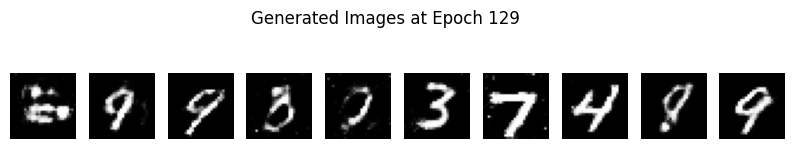

Epoch [129/200], d_loss: 0.7760, g_loss: 2.2461, D(x): 0.72, D(G(z)): 0.28
Epoch [130/200], d_loss: 0.8403, g_loss: 1.6874, D(x): 0.74, D(G(z)): 0.28
Epoch [131/200], d_loss: 1.0275, g_loss: 1.9981, D(x): 0.70, D(G(z)): 0.27
Epoch [132/200], d_loss: 0.7977, g_loss: 1.9824, D(x): 0.67, D(G(z)): 0.21
Epoch [133/200], d_loss: 1.1242, g_loss: 2.1789, D(x): 0.59, D(G(z)): 0.22
Epoch [134/200], d_loss: 0.9528, g_loss: 1.4383, D(x): 0.58, D(G(z)): 0.13
Epoch [135/200], d_loss: 0.7817, g_loss: 1.8451, D(x): 0.76, D(G(z)): 0.27
Epoch [136/200], d_loss: 0.8893, g_loss: 2.8315, D(x): 0.67, D(G(z)): 0.26
Epoch [137/200], d_loss: 0.8487, g_loss: 1.7583, D(x): 0.82, D(G(z)): 0.36
Epoch [138/200], d_loss: 0.7785, g_loss: 2.3953, D(x): 0.75, D(G(z)): 0.29


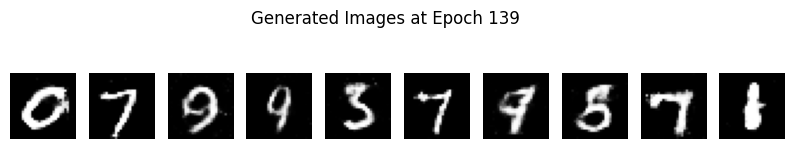

Epoch [139/200], d_loss: 0.6916, g_loss: 1.6708, D(x): 0.81, D(G(z)): 0.28
Epoch [140/200], d_loss: 0.9306, g_loss: 1.5259, D(x): 0.66, D(G(z)): 0.29
Epoch [141/200], d_loss: 0.9995, g_loss: 1.6660, D(x): 0.58, D(G(z)): 0.27
Epoch [142/200], d_loss: 0.8796, g_loss: 1.4061, D(x): 0.74, D(G(z)): 0.31
Epoch [143/200], d_loss: 1.0912, g_loss: 1.8740, D(x): 0.61, D(G(z)): 0.24
Epoch [144/200], d_loss: 0.5477, g_loss: 1.5210, D(x): 0.73, D(G(z)): 0.16
Epoch [145/200], d_loss: 0.9442, g_loss: 1.8797, D(x): 0.65, D(G(z)): 0.20
Epoch [146/200], d_loss: 0.9808, g_loss: 2.1206, D(x): 0.69, D(G(z)): 0.25
Epoch [147/200], d_loss: 0.9366, g_loss: 1.8142, D(x): 0.76, D(G(z)): 0.33
Epoch [148/200], d_loss: 0.7723, g_loss: 1.3197, D(x): 0.72, D(G(z)): 0.23


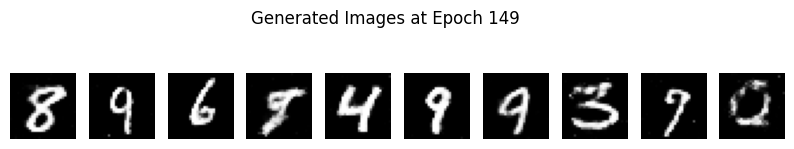

Epoch [149/200], d_loss: 0.8726, g_loss: 1.8982, D(x): 0.79, D(G(z)): 0.38
Epoch [150/200], d_loss: 0.8425, g_loss: 2.0368, D(x): 0.72, D(G(z)): 0.28
Epoch [151/200], d_loss: 0.7290, g_loss: 1.5856, D(x): 0.78, D(G(z)): 0.33
Epoch [152/200], d_loss: 1.0240, g_loss: 1.4637, D(x): 0.63, D(G(z)): 0.24
Epoch [153/200], d_loss: 0.9714, g_loss: 1.6768, D(x): 0.69, D(G(z)): 0.31
Epoch [154/200], d_loss: 0.9309, g_loss: 1.8067, D(x): 0.70, D(G(z)): 0.29
Epoch [155/200], d_loss: 0.9931, g_loss: 1.6118, D(x): 0.71, D(G(z)): 0.32
Epoch [156/200], d_loss: 0.6654, g_loss: 1.9286, D(x): 0.70, D(G(z)): 0.19
Epoch [157/200], d_loss: 0.7816, g_loss: 2.1478, D(x): 0.72, D(G(z)): 0.25
Epoch [158/200], d_loss: 1.0136, g_loss: 1.7629, D(x): 0.66, D(G(z)): 0.31


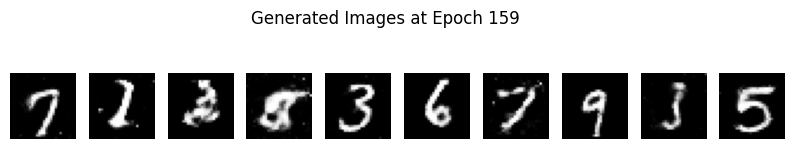

Epoch [159/200], d_loss: 1.0724, g_loss: 1.6246, D(x): 0.68, D(G(z)): 0.34
Epoch [160/200], d_loss: 1.1563, g_loss: 2.3502, D(x): 0.71, D(G(z)): 0.39
Epoch [161/200], d_loss: 0.9360, g_loss: 1.8612, D(x): 0.73, D(G(z)): 0.31
Epoch [162/200], d_loss: 0.8511, g_loss: 1.6732, D(x): 0.77, D(G(z)): 0.33
Epoch [163/200], d_loss: 0.8273, g_loss: 1.7742, D(x): 0.64, D(G(z)): 0.14
Epoch [164/200], d_loss: 1.0054, g_loss: 1.5131, D(x): 0.67, D(G(z)): 0.30
Epoch [165/200], d_loss: 0.6709, g_loss: 1.4702, D(x): 0.71, D(G(z)): 0.20
Epoch [166/200], d_loss: 0.8639, g_loss: 1.7791, D(x): 0.72, D(G(z)): 0.28
Epoch [167/200], d_loss: 0.8687, g_loss: 1.6435, D(x): 0.73, D(G(z)): 0.29
Epoch [168/200], d_loss: 0.7962, g_loss: 1.8892, D(x): 0.74, D(G(z)): 0.29


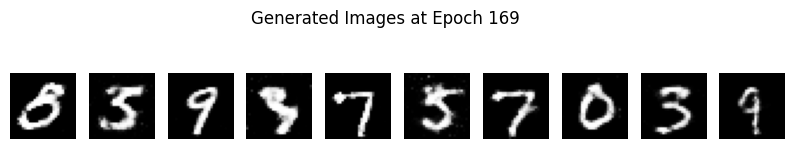

Epoch [169/200], d_loss: 0.5751, g_loss: 1.7589, D(x): 0.79, D(G(z)): 0.23
Epoch [170/200], d_loss: 0.6858, g_loss: 1.6560, D(x): 0.75, D(G(z)): 0.21
Epoch [171/200], d_loss: 0.7363, g_loss: 1.4198, D(x): 0.77, D(G(z)): 0.28
Epoch [172/200], d_loss: 0.5981, g_loss: 1.6432, D(x): 0.81, D(G(z)): 0.27
Epoch [173/200], d_loss: 0.8539, g_loss: 1.9014, D(x): 0.75, D(G(z)): 0.32
Epoch [174/200], d_loss: 0.9185, g_loss: 1.8413, D(x): 0.71, D(G(z)): 0.27
Epoch [175/200], d_loss: 0.7439, g_loss: 2.4973, D(x): 0.80, D(G(z)): 0.27
Epoch [176/200], d_loss: 0.6646, g_loss: 2.0877, D(x): 0.75, D(G(z)): 0.20
Epoch [177/200], d_loss: 0.9279, g_loss: 1.9250, D(x): 0.67, D(G(z)): 0.25
Epoch [178/200], d_loss: 0.6273, g_loss: 1.4899, D(x): 0.78, D(G(z)): 0.24


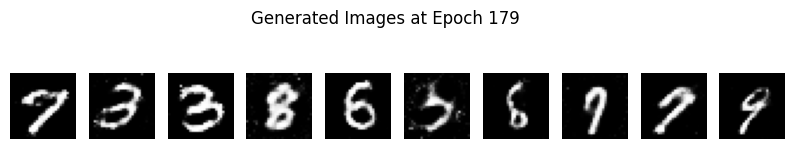

Epoch [179/200], d_loss: 0.6572, g_loss: 1.9560, D(x): 0.76, D(G(z)): 0.23
Epoch [180/200], d_loss: 0.8364, g_loss: 2.0006, D(x): 0.67, D(G(z)): 0.17
Epoch [181/200], d_loss: 0.9004, g_loss: 1.6647, D(x): 0.65, D(G(z)): 0.24
Epoch [182/200], d_loss: 0.6453, g_loss: 1.7907, D(x): 0.66, D(G(z)): 0.14
Epoch [183/200], d_loss: 0.9151, g_loss: 1.6250, D(x): 0.78, D(G(z)): 0.39
Epoch [184/200], d_loss: 0.7745, g_loss: 1.7104, D(x): 0.83, D(G(z)): 0.30
Epoch [185/200], d_loss: 0.8080, g_loss: 2.2754, D(x): 0.71, D(G(z)): 0.23
Epoch [186/200], d_loss: 0.9370, g_loss: 1.6276, D(x): 0.75, D(G(z)): 0.35
Epoch [187/200], d_loss: 0.8265, g_loss: 1.9982, D(x): 0.78, D(G(z)): 0.33
Epoch [188/200], d_loss: 0.7369, g_loss: 1.9144, D(x): 0.84, D(G(z)): 0.35


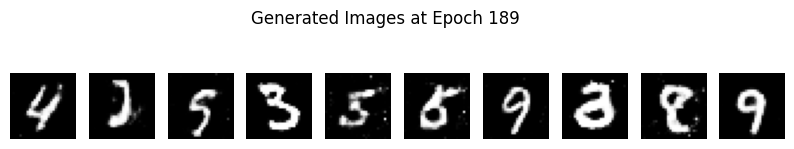

Epoch [189/200], d_loss: 0.8576, g_loss: 1.7402, D(x): 0.75, D(G(z)): 0.32
Epoch [190/200], d_loss: 0.7518, g_loss: 1.5335, D(x): 0.78, D(G(z)): 0.27
Epoch [191/200], d_loss: 0.9209, g_loss: 1.6337, D(x): 0.77, D(G(z)): 0.33
Epoch [192/200], d_loss: 0.7985, g_loss: 2.0719, D(x): 0.73, D(G(z)): 0.27
Epoch [193/200], d_loss: 1.0372, g_loss: 1.5171, D(x): 0.80, D(G(z)): 0.46
Epoch [194/200], d_loss: 0.7486, g_loss: 2.3497, D(x): 0.72, D(G(z)): 0.17
Epoch [195/200], d_loss: 1.1831, g_loss: 2.2810, D(x): 0.57, D(G(z)): 0.26
Epoch [196/200], d_loss: 0.8372, g_loss: 2.1477, D(x): 0.65, D(G(z)): 0.21
Epoch [197/200], d_loss: 0.9100, g_loss: 1.8462, D(x): 0.64, D(G(z)): 0.22
Epoch [198/200], d_loss: 0.9871, g_loss: 1.7658, D(x): 0.64, D(G(z)): 0.29


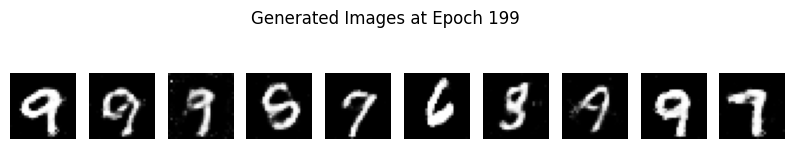

Epoch [199/200], d_loss: 0.7348, g_loss: 2.0323, D(x): 0.82, D(G(z)): 0.30


In [ ]:
num_epochs = 200
losses_g = []
losses_d = []

for epoch in range(num_epochs):
    for batch_idx, (real_images, _) in enumerate(train_loader):
        # EN cada epoch, entrenamos el discriminador con imágenes reales y falsas, y luego entrenamos el generador para engañar al discriminador.

        # Defino el batch_size
        batch_size = real_images.size(0)


        # Aplano las imágenes reales y transferirlas a la GPU para su procesamiento
        real_images = real_images.view(batch_size, -1).cuda()

        # Creo etiquetas para datos reales (1) y falsos (0)
        real_labels = torch.ones(batch_size, 1).cuda()
        fake_labels = torch.zeros(batch_size, 1).cuda()

        # ===== Entrenamiento del discriminador =====
        # Se calcula la perdida del discriminador con imágenes reales
        outputs = D(real_images)
        d_loss_real = criterion(outputs, real_labels)
        real_score = outputs

        # Genero imágenes falsas con ruido aleatorio
        z = torch.randn(batch_size, z_dim).cuda()
        fake_images = G(z)

        # Calculo la pérdida del discriminador con imágenes falsas
        outputs = D(fake_images)
        d_loss_fake = criterion(outputs, fake_labels)
        fake_score = outputs # Mientras mas cerca de 0 esto hace un mejor discriminador

        # Calculo la loss y realizo backpropagation para actualizar el discriminador
        d_loss = d_loss_real + d_loss_fake
        d_optimizer.zero_grad()
        d_loss.backward()
        d_optimizer.step()

        # ===== Entrenamiento del generador =====
        # Generar nuevas imágenes falsas
        z = torch.randn(batch_size, z_dim).cuda()
        fake_images = G(z)

        # Calcular la perdida del generador (que tan bien esta engañando al discriminador)
        outputs = D(fake_images)
        g_loss = criterion(outputs, real_labels)

        # Realizo backpropagation y se actualiza el generador
        g_optimizer.zero_grad()
        g_loss.backward()
        g_optimizer.step()

        # Guardo las pérdidas para analizar luego
        losses_g.append(g_loss.item())
        losses_d.append(d_loss.item())
    if (epoch + 1) % 10 == 0:
        show_generated_images(epoch, G, z_dim)

    print(f'Epoch [{epoch}/{num_epochs}], d_loss: {d_loss.item():.4f}, g_loss: {g_loss.item():.4f}, D(x): {real_score.mean().item():.2f}, D(G(z)): {fake_score.mean().item():.2f}')



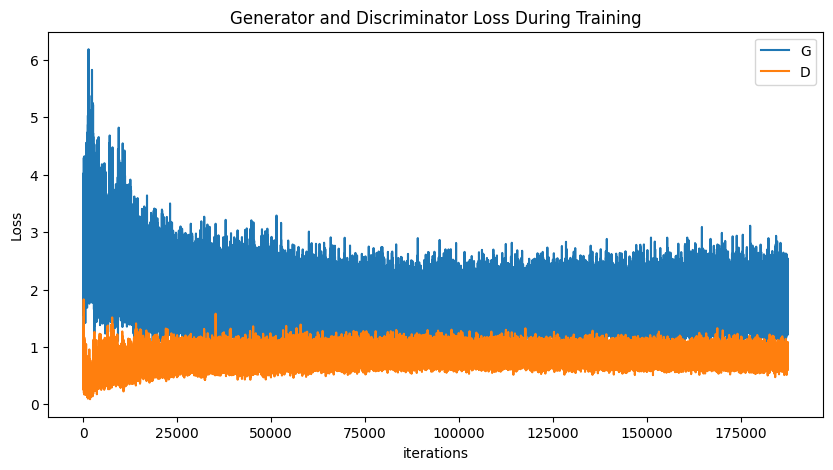

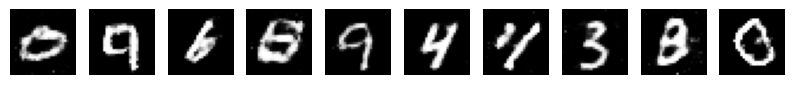

In [ ]:
# Observo la pérdida para el generador y el discriminador durante el entrenamiento y muestro una cierta cantidad de imágenes de salida.

def show_fake_images(generator, z_dim,num_images=10):
    z = torch.randn(num_images, z_dim).cuda()
    fake_images = generator(z)
    fake_images = fake_images.view(fake_images.size(0), 28, 28).data.cpu().numpy()

    plt.figure(figsize=(10, 2))
    for i in range(num_images):
        plt.subplot(1, num_images, i+1)
        plt.imshow(fake_images[i], cmap='gray')
        plt.axis('off')
    plt.show()

plt.figure(figsize=(10, 5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(losses_g, label="G")
plt.plot(losses_d, label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()


show_fake_images(G,z_dim)


## DCGANs

### Carga de datos

In [ ]:
import torch
import torch.nn as nn
import torchvision.datasets as dsets
import torchvision.transforms as transforms


In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5, ), std=(0.5, ))
])

mnist = dsets.MNIST(root='./data', train=True, transform=transform, download=True)
train_loader = torch.utils.data.DataLoader(dataset=mnist, batch_size=batch_size, shuffle=True)


100%|██████████| 9912422/9912422 [00:00<00:00, 444702818.93it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 28053657.67it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 121188977.81it/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 6369284.11it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



In [ ]:
batch_size = 100
learning_rate = 0.0002
z_dim = 100
z = torch.randn(batch_size, z_dim, 1, 1).cuda()


###  Modelos Generador Discriminador

In [ ]:
class Generator(nn.Module):
    """
    El generador toma un vector de ruido y lo convierte en una imagen.
    """

    def __init__(self):
        super(Generator, self).__init__()
        # EL generador son capas convolucionales transpuestas para ampliar progresivamente el vector de ruido
        self.main = nn.Sequential(
            nn.ConvTranspose2d(z_dim, 256, 4, 1, 0, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            nn.ConvTranspose2d(256, 128, 3, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            nn.ConvTranspose2d(64, 1, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)


In [ ]:
class Discriminator(nn.Module):
    """
    El discriminador toma una imagen y determina si es real o generada por el Generador.
    """
    def __init__(self):
        # Capas convolucionales para clasificar las imágenes en reales o falsas
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(1, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 3, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)


In [ ]:
# Inicialización de pesos: Esta función ayuda a la estabilidad del entrenamiento.

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [ ]:
G = Generator().cuda()
D = Discriminator().cuda()

G.apply(weights_init)
D.apply(weights_init)


Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (9): Sigmoid()
  )
)

In [ ]:
# Funciones de perdida y optimizadores
criterion = nn.BCELoss()

d_optimizer = torch.optim.Adam(D.parameters(), lr=learning_rate)
g_optimizer = torch.optim.Adam(G.parameters(), lr=learning_rate)


In [ ]:
def show_generated_images(epoch, generator, z_dim, num_images=10):
    z = torch.randn(batch_size, z_dim, 1, 1).cuda()  # Ajuste del tamaño del ruido
    with torch.no_grad():
        fake_images = generator(z).view(-1, 28, 28).cpu().data.numpy()

    plt.figure(figsize=(10, 2))
    for i in range(num_images):
        plt.subplot(1, num_images, i+1)
        plt.imshow(fake_images[i], cmap='gray')
        plt.axis('off')
    plt.suptitle(f'Generated Images at Epoch {epoch}')
    plt.show()

### Bucle de entrenamiento

Epoch [0/100], d_loss: 0.2158, g_loss: 7.8811, D(x): 0.84, D(G(z)): 0.00


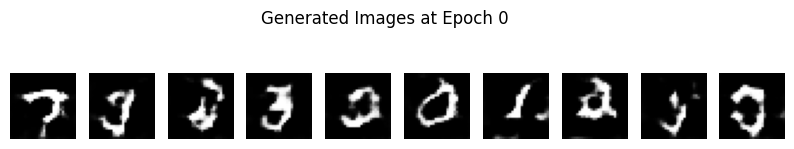

Epoch [1/100], d_loss: 0.4936, g_loss: 1.9481, D(x): 0.88, D(G(z)): 0.25
Epoch [2/100], d_loss: 0.9822, g_loss: 0.7699, D(x): 0.97, D(G(z)): 0.56
Epoch [3/100], d_loss: 0.3946, g_loss: 2.2156, D(x): 0.74, D(G(z)): 0.04
Epoch [4/100], d_loss: 0.5774, g_loss: 2.1904, D(x): 0.96, D(G(z)): 0.37
Epoch [5/100], d_loss: 0.2453, g_loss: 3.2398, D(x): 0.87, D(G(z)): 0.08
Epoch [6/100], d_loss: 0.2926, g_loss: 4.0719, D(x): 0.84, D(G(z)): 0.08
Epoch [7/100], d_loss: 0.5607, g_loss: 2.3632, D(x): 0.65, D(G(z)): 0.06
Epoch [8/100], d_loss: 0.2479, g_loss: 2.8457, D(x): 0.90, D(G(z)): 0.12
Epoch [9/100], d_loss: 0.2470, g_loss: 2.5455, D(x): 0.96, D(G(z)): 0.17
Epoch [10/100], d_loss: 0.2434, g_loss: 2.1643, D(x): 0.95, D(G(z)): 0.14


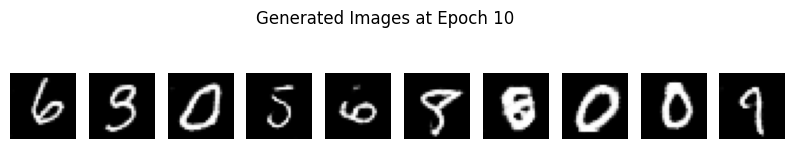

Epoch [11/100], d_loss: 0.1800, g_loss: 1.6289, D(x): 0.90, D(G(z)): 0.07
Epoch [12/100], d_loss: 0.1587, g_loss: 3.4803, D(x): 0.95, D(G(z)): 0.09
Epoch [13/100], d_loss: 0.4499, g_loss: 5.1536, D(x): 0.67, D(G(z)): 0.01
Epoch [14/100], d_loss: 0.2018, g_loss: 4.4517, D(x): 0.85, D(G(z)): 0.02
Epoch [15/100], d_loss: 0.9636, g_loss: 1.0595, D(x): 1.00, D(G(z)): 0.55
Epoch [16/100], d_loss: 0.1016, g_loss: 2.7406, D(x): 0.99, D(G(z)): 0.08
Epoch [17/100], d_loss: 0.2246, g_loss: 1.7714, D(x): 0.90, D(G(z)): 0.10
Epoch [18/100], d_loss: 0.1095, g_loss: 4.0000, D(x): 0.96, D(G(z)): 0.06
Epoch [19/100], d_loss: 0.1382, g_loss: 2.2474, D(x): 0.89, D(G(z)): 0.02
Epoch [20/100], d_loss: 0.0336, g_loss: 2.8399, D(x): 0.98, D(G(z)): 0.01


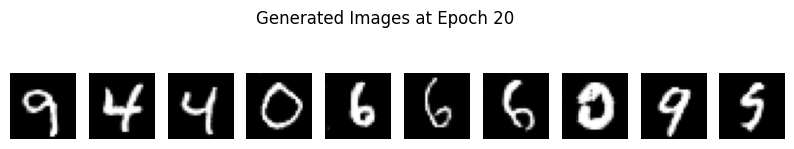

Epoch [21/100], d_loss: 0.1329, g_loss: 2.6328, D(x): 0.90, D(G(z)): 0.02
Epoch [22/100], d_loss: 0.0434, g_loss: 2.7084, D(x): 0.99, D(G(z)): 0.04
Epoch [23/100], d_loss: 0.1050, g_loss: 7.7914, D(x): 0.91, D(G(z)): 0.01
Epoch [24/100], d_loss: 0.3000, g_loss: 4.4200, D(x): 0.79, D(G(z)): 0.02
Epoch [25/100], d_loss: 0.5630, g_loss: 3.8276, D(x): 0.64, D(G(z)): 0.01
Epoch [26/100], d_loss: 0.0951, g_loss: 2.1723, D(x): 0.96, D(G(z)): 0.05
Epoch [27/100], d_loss: 0.1074, g_loss: 4.7849, D(x): 0.98, D(G(z)): 0.07


In [ ]:
losses_g = []
losses_d = []

num_epochs = 100
i = 0
# Bucle de entrenamiento
for epoch in range(num_epochs):
    for batch_idx, (real_images, _) in enumerate(train_loader):
        # Ajustar tamaño del batch y mover imágenes a la GPU
        batch_size = real_images.size(0)
        real_images = real_images.cuda()

        # Etiquetas para datos reales (1) y falsos (0)
        real_labels = torch.ones(batch_size, 1, 1, 1).cuda()
        fake_labels = torch.zeros(batch_size, 1, 1, 1).cuda()

        # ===== Entrenamiento del discriminador =====
        # Calculo la pérdida con imágenes reales
        outputs = D(real_images)
        d_loss_real = criterion(outputs, real_labels)
        real_score = outputs

        # Genero imágenes falsas
        z = torch.randn(batch_size, z_dim, 1, 1).cuda()  # Ajuste del tamaño del ruido
        fake_images = G(z)

        # Calculo la pérdida con imágenes falsas
        outputs = D(fake_images.detach())
        d_loss_fake = criterion(outputs, fake_labels)
        fake_score = outputs

        # Backpropagation y optimización del discriminador
        d_loss = d_loss_real + d_loss_fake
        d_optimizer.zero_grad()
        d_loss.backward()
        d_optimizer.step()

        # ===== Entrenamiento del generador =====
        # Genero nuevas imágenes falsas
        z = torch.randn(batch_size, z_dim, 1, 1).cuda()
        fake_images = G(z)

        # Calculo la pérdida del generador (que esta intentando engañar al discriminador)
        outputs = D(fake_images)
        g_loss = criterion(outputs, real_labels)  # Aquí usamos real_labels porque queremos que el generador engañe al discriminador

        # Backpropagation y optimización del generador
        g_optimizer.zero_grad()
        g_loss.backward()
        g_optimizer.step()

        # Registro las pérdidas par analisis
        losses_g.append(g_loss.item())
        losses_d.append(d_loss.item())

    print(f'Epoch [{epoch}/{num_epochs}], d_loss: {d_loss.item():.4f}, g_loss: {g_loss.item():.4f}, D(x): {real_score.mean().item():.2f}, D(G(z)): {fake_score.mean().item():.2f}')

    if epoch % 10 == 0:
      show_generated_images(epoch, G, z_dim)
      # show_fake_images(G)


    # Imprimir las estadísticas del entrenamiento


In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(losses_g, label="G")
plt.plot(losses_d, label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()



show_fake_images(G)

# Otros datasets

## Fashion Mnist

### Carga de datos

In [2]:
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torch
# Transformación y carga del conjunto de datos Fashion MNIST
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

train_loader = torch.utils.data.DataLoader(
    datasets.FashionMNIST('.', train=True, download=True, transform=transform),
    batch_size=128, shuffle=True)

100%|██████████| 26421880/26421880 [00:02<00:00, 11062339.22it/s]


Extracting ./FashionMNIST/raw/train-images-idx3-ubyte.gz to ./FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 177089.41it/s]


Extracting ./FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:01<00:00, 3216741.27it/s]


Extracting ./FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 7958819.39it/s]

Extracting ./FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./FashionMNIST/raw



### Modelos Generador y Discriminador

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
import torchvision.utils as vutils
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np

# Implementación del Generador
class Generator(nn.Module):
    """
    El generador toma un vector de ruido y lo convierte en una imagen.
    """
    def __init__(self, num_features):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.Linear(num_features, 7*7*128),
            nn.BatchNorm1d(7*7*128),
            nn.ReLU(True),
        )

        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=5, stride=2, padding=2, output_padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 1, kernel_size=5, stride=2, padding=2, output_padding=1),
            nn.Tanh()
        )

    def forward(self, input):
        x = self.main(input)
        x = x.view(-1, 128, 7, 7)  # Reformo el tensor antes de pasarlo a las capas convolucionales
        return self.deconv(x)

# Implementación del Discriminador
class Discriminator(nn.Module):
    """
    El discriminador toma una imagen y determina si es real o generada por el Generador.
    """
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=5, stride=2, padding=2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Conv2d(64, 128, kernel_size=5, stride=2, padding=2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Flatten(),
            nn.Linear(7*7*128, 1),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)


In [6]:
num_epochs = 100
z_dim = 100

# Instanciando el Generador y el Discriminador
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

generator = Generator(z_dim).to(device)
discriminator = Discriminator().to(device)

# Optimizadores y función de pérdida
optimizer_g = optim.RMSprop(generator.parameters(), lr=0.0005)
optimizer_d = optim.RMSprop(discriminator.parameters(), lr=0.0005)

criterion = nn.BCELoss()

In [7]:
def show_generated_images(epoch, generator, z_dim, num_images=10):
    # Ensure the noise tensor is correctly shaped
    device = next(generator.parameters()).device

    z = torch.randn(num_images, z_dim).to(device)  # Shape: [num_images, z_dim]

    with torch.no_grad():
        # Generate images using the generator
        fake_images = generator(z)
        # Assuming the generator outputs images in the shape [batch_size, channels, height, width]
        fake_images = fake_images.cpu().data.numpy()
        fake_images = np.transpose(fake_images, (0, 2, 3, 1))  # Change to [batch_size, height, width, channels]
        fake_images = (fake_images + 1) / 2.0  # Rescale from [-1, 1] to [0, 1] for displaying

    plt.figure(figsize=(10, 2))
    for i in range(num_images):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(fake_images[i], cmap='gray')
        plt.axis('off')
    plt.suptitle(f'Generated Images at Epoch {epoch + 1}')
    plt.show()


### Bucle de entrenamiento

100%|██████████| 469/469 [00:24<00:00, 19.08it/s]


Epoch [0/100], d_loss: 0.3155, g_loss: 2.0198, D(x): 0.69, D(G(z)): 0.17


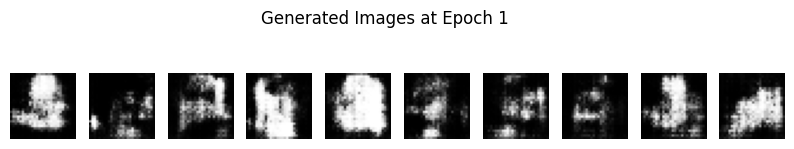

100%|██████████| 469/469 [00:17<00:00, 27.10it/s]


Epoch [1/100], d_loss: 0.3176, g_loss: 1.6939, D(x): 0.78, D(G(z)): 0.22


100%|██████████| 469/469 [00:17<00:00, 27.11it/s]


Epoch [2/100], d_loss: 0.3193, g_loss: 2.4904, D(x): 0.74, D(G(z)): 0.14


100%|██████████| 469/469 [00:17<00:00, 26.33it/s]


Epoch [3/100], d_loss: 0.2498, g_loss: 2.2494, D(x): 0.83, D(G(z)): 0.17


100%|██████████| 469/469 [00:17<00:00, 26.70it/s]


Epoch [4/100], d_loss: 0.3130, g_loss: 1.5853, D(x): 0.87, D(G(z)): 0.30


100%|██████████| 469/469 [00:17<00:00, 27.25it/s]


Epoch [5/100], d_loss: 0.4673, g_loss: 0.9324, D(x): 0.85, D(G(z)): 0.44


100%|██████████| 469/469 [00:17<00:00, 27.04it/s]


Epoch [6/100], d_loss: 0.3881, g_loss: 1.3994, D(x): 0.79, D(G(z)): 0.33


100%|██████████| 469/469 [00:17<00:00, 26.25it/s]


Epoch [7/100], d_loss: 0.4476, g_loss: 1.3497, D(x): 0.74, D(G(z)): 0.33


100%|██████████| 469/469 [00:17<00:00, 26.58it/s]


Epoch [8/100], d_loss: 0.3995, g_loss: 1.2860, D(x): 0.79, D(G(z)): 0.36


100%|██████████| 469/469 [00:17<00:00, 27.19it/s]


Epoch [9/100], d_loss: 0.3503, g_loss: 1.9136, D(x): 0.74, D(G(z)): 0.22


100%|██████████| 469/469 [00:17<00:00, 26.77it/s]


Epoch [10/100], d_loss: 0.2851, g_loss: 2.2525, D(x): 0.78, D(G(z)): 0.18


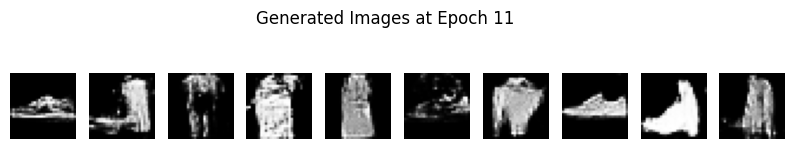

100%|██████████| 469/469 [00:17<00:00, 27.04it/s]


Epoch [11/100], d_loss: 0.2632, g_loss: 2.5182, D(x): 0.81, D(G(z)): 0.17


100%|██████████| 469/469 [00:17<00:00, 26.92it/s]


Epoch [12/100], d_loss: 0.3159, g_loss: 2.5727, D(x): 0.76, D(G(z)): 0.14


100%|██████████| 469/469 [00:17<00:00, 27.10it/s]


Epoch [13/100], d_loss: 0.2730, g_loss: 2.3925, D(x): 0.79, D(G(z)): 0.16


100%|██████████| 469/469 [00:17<00:00, 26.97it/s]


Epoch [14/100], d_loss: 0.3130, g_loss: 2.1221, D(x): 0.79, D(G(z)): 0.20


100%|██████████| 469/469 [00:17<00:00, 27.03it/s]


Epoch [15/100], d_loss: 0.3424, g_loss: 1.6321, D(x): 0.82, D(G(z)): 0.29


100%|██████████| 469/469 [00:17<00:00, 26.96it/s]


Epoch [16/100], d_loss: 0.3699, g_loss: 1.5310, D(x): 0.81, D(G(z)): 0.29


100%|██████████| 469/469 [00:17<00:00, 26.73it/s]


Epoch [17/100], d_loss: 0.4437, g_loss: 1.4988, D(x): 0.76, D(G(z)): 0.34


100%|██████████| 469/469 [00:18<00:00, 25.42it/s]


Epoch [18/100], d_loss: 0.3055, g_loss: 2.2005, D(x): 0.79, D(G(z)): 0.21


100%|██████████| 469/469 [00:17<00:00, 27.11it/s]


Epoch [19/100], d_loss: 0.4421, g_loss: 1.6493, D(x): 0.70, D(G(z)): 0.30


100%|██████████| 469/469 [00:17<00:00, 26.95it/s]


Epoch [20/100], d_loss: 0.3660, g_loss: 1.8748, D(x): 0.74, D(G(z)): 0.23


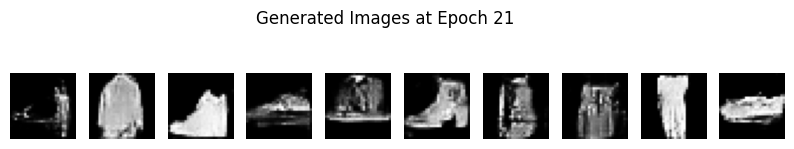

100%|██████████| 469/469 [00:18<00:00, 25.85it/s]


Epoch [21/100], d_loss: 0.5127, g_loss: 1.6685, D(x): 0.61, D(G(z)): 0.26


100%|██████████| 469/469 [00:17<00:00, 26.28it/s]


Epoch [22/100], d_loss: 0.4838, g_loss: 1.1486, D(x): 0.72, D(G(z)): 0.39


100%|██████████| 469/469 [00:17<00:00, 26.84it/s]


Epoch [23/100], d_loss: 0.4954, g_loss: 1.1004, D(x): 0.73, D(G(z)): 0.39


100%|██████████| 469/469 [00:17<00:00, 27.31it/s]


Epoch [24/100], d_loss: 0.4639, g_loss: 1.0285, D(x): 0.78, D(G(z)): 0.42


100%|██████████| 469/469 [00:17<00:00, 27.01it/s]


Epoch [25/100], d_loss: 0.6600, g_loss: 0.7794, D(x): 0.74, D(G(z)): 0.53


100%|██████████| 469/469 [00:17<00:00, 27.31it/s]


Epoch [26/100], d_loss: 0.5086, g_loss: 1.1163, D(x): 0.70, D(G(z)): 0.39


100%|██████████| 469/469 [00:17<00:00, 26.67it/s]


Epoch [27/100], d_loss: 0.5444, g_loss: 1.7013, D(x): 0.58, D(G(z)): 0.28


100%|██████████| 469/469 [00:17<00:00, 27.13it/s]


Epoch [28/100], d_loss: 0.5123, g_loss: 1.6117, D(x): 0.57, D(G(z)): 0.25


100%|██████████| 469/469 [00:17<00:00, 26.99it/s]


Epoch [29/100], d_loss: 0.5395, g_loss: 1.2053, D(x): 0.63, D(G(z)): 0.35


100%|██████████| 469/469 [00:17<00:00, 27.02it/s]


Epoch [30/100], d_loss: 0.5634, g_loss: 1.3635, D(x): 0.58, D(G(z)): 0.33


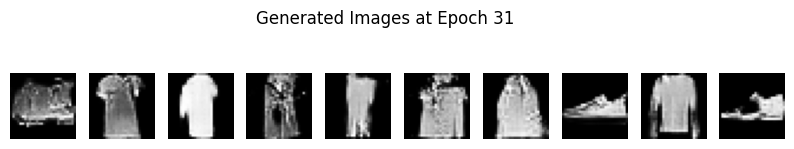

100%|██████████| 469/469 [00:17<00:00, 27.14it/s]


Epoch [31/100], d_loss: 0.5831, g_loss: 0.7043, D(x): 0.80, D(G(z)): 0.54


100%|██████████| 469/469 [00:17<00:00, 27.06it/s]


Epoch [32/100], d_loss: 0.5537, g_loss: 1.2718, D(x): 0.58, D(G(z)): 0.32


100%|██████████| 469/469 [00:17<00:00, 26.93it/s]


Epoch [33/100], d_loss: 0.5020, g_loss: 1.0188, D(x): 0.70, D(G(z)): 0.40


100%|██████████| 469/469 [00:17<00:00, 26.86it/s]


Epoch [34/100], d_loss: 0.5481, g_loss: 0.9972, D(x): 0.67, D(G(z)): 0.42


100%|██████████| 469/469 [00:17<00:00, 27.20it/s]


Epoch [35/100], d_loss: 0.5942, g_loss: 0.8435, D(x): 0.65, D(G(z)): 0.46


100%|██████████| 469/469 [00:17<00:00, 27.22it/s]


Epoch [36/100], d_loss: 0.5433, g_loss: 0.9468, D(x): 0.66, D(G(z)): 0.40


100%|██████████| 469/469 [00:17<00:00, 26.81it/s]


Epoch [37/100], d_loss: 0.5218, g_loss: 1.2124, D(x): 0.61, D(G(z)): 0.33


100%|██████████| 469/469 [00:17<00:00, 27.30it/s]


Epoch [38/100], d_loss: 0.5374, g_loss: 0.9504, D(x): 0.71, D(G(z)): 0.45


100%|██████████| 469/469 [00:17<00:00, 27.14it/s]


Epoch [39/100], d_loss: 0.5435, g_loss: 1.2667, D(x): 0.58, D(G(z)): 0.33


100%|██████████| 469/469 [00:17<00:00, 27.38it/s]


Epoch [40/100], d_loss: 0.5913, g_loss: 0.9573, D(x): 0.62, D(G(z)): 0.41


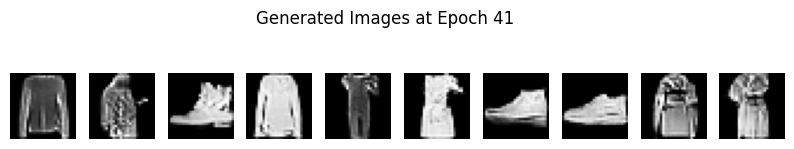

100%|██████████| 469/469 [00:17<00:00, 27.00it/s]


Epoch [41/100], d_loss: 0.5889, g_loss: 1.2337, D(x): 0.52, D(G(z)): 0.32


100%|██████████| 469/469 [00:17<00:00, 27.13it/s]


Epoch [42/100], d_loss: 0.5625, g_loss: 1.2721, D(x): 0.59, D(G(z)): 0.36


100%|██████████| 469/469 [00:17<00:00, 27.10it/s]


Epoch [43/100], d_loss: 0.6521, g_loss: 1.4369, D(x): 0.44, D(G(z)): 0.27


100%|██████████| 469/469 [00:17<00:00, 26.99it/s]


Epoch [44/100], d_loss: 0.5636, g_loss: 0.9505, D(x): 0.63, D(G(z)): 0.41


100%|██████████| 469/469 [00:17<00:00, 27.17it/s]


Epoch [45/100], d_loss: 0.5813, g_loss: 0.9408, D(x): 0.65, D(G(z)): 0.44


100%|██████████| 469/469 [00:17<00:00, 26.85it/s]


Epoch [46/100], d_loss: 0.5241, g_loss: 0.9454, D(x): 0.67, D(G(z)): 0.43


100%|██████████| 469/469 [00:17<00:00, 27.17it/s]


Epoch [47/100], d_loss: 0.5433, g_loss: 1.1061, D(x): 0.63, D(G(z)): 0.40


100%|██████████| 469/469 [00:17<00:00, 26.97it/s]


Epoch [48/100], d_loss: 0.6301, g_loss: 0.9516, D(x): 0.61, D(G(z)): 0.46


100%|██████████| 469/469 [00:17<00:00, 27.00it/s]


Epoch [49/100], d_loss: 0.6068, g_loss: 1.3349, D(x): 0.50, D(G(z)): 0.31


100%|██████████| 469/469 [00:17<00:00, 27.08it/s]


Epoch [50/100], d_loss: 0.6155, g_loss: 1.1328, D(x): 0.56, D(G(z)): 0.39


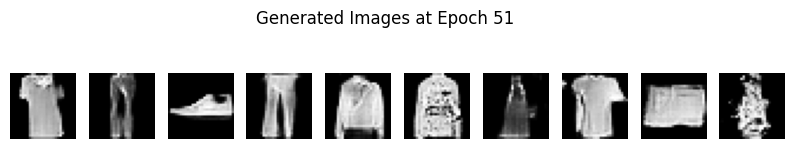

100%|██████████| 469/469 [00:17<00:00, 26.85it/s]


Epoch [51/100], d_loss: 0.6179, g_loss: 0.9539, D(x): 0.59, D(G(z)): 0.42


100%|██████████| 469/469 [00:17<00:00, 26.96it/s]


Epoch [52/100], d_loss: 0.6039, g_loss: 1.0052, D(x): 0.61, D(G(z)): 0.42


100%|██████████| 469/469 [00:17<00:00, 27.03it/s]


Epoch [53/100], d_loss: 0.5630, g_loss: 1.0795, D(x): 0.57, D(G(z)): 0.36


100%|██████████| 469/469 [00:17<00:00, 26.92it/s]


Epoch [54/100], d_loss: 0.5528, g_loss: 1.0889, D(x): 0.59, D(G(z)): 0.36


100%|██████████| 469/469 [00:17<00:00, 26.74it/s]


Epoch [55/100], d_loss: 0.5760, g_loss: 0.9783, D(x): 0.63, D(G(z)): 0.42


100%|██████████| 469/469 [00:17<00:00, 27.14it/s]


Epoch [56/100], d_loss: 0.6375, g_loss: 1.2662, D(x): 0.51, D(G(z)): 0.36


100%|██████████| 469/469 [00:17<00:00, 27.07it/s]


Epoch [57/100], d_loss: 0.6607, g_loss: 1.1393, D(x): 0.52, D(G(z)): 0.39


100%|██████████| 469/469 [00:17<00:00, 26.93it/s]


Epoch [58/100], d_loss: 0.6156, g_loss: 0.9549, D(x): 0.61, D(G(z)): 0.45


100%|██████████| 469/469 [00:17<00:00, 27.02it/s]


Epoch [59/100], d_loss: 0.6152, g_loss: 1.1070, D(x): 0.56, D(G(z)): 0.39


100%|██████████| 469/469 [00:17<00:00, 26.98it/s]


Epoch [60/100], d_loss: 0.5702, g_loss: 1.0862, D(x): 0.57, D(G(z)): 0.37


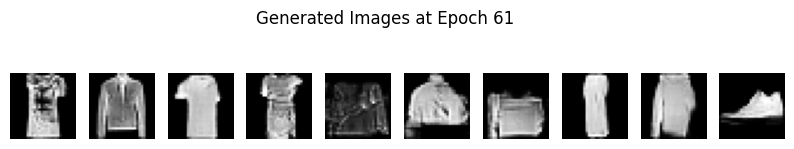

100%|██████████| 469/469 [00:17<00:00, 26.99it/s]


Epoch [61/100], d_loss: 0.5746, g_loss: 0.9995, D(x): 0.62, D(G(z)): 0.41


100%|██████████| 469/469 [00:17<00:00, 26.94it/s]


Epoch [62/100], d_loss: 0.5877, g_loss: 0.8604, D(x): 0.64, D(G(z)): 0.45


100%|██████████| 469/469 [00:17<00:00, 27.15it/s]


Epoch [63/100], d_loss: 0.6196, g_loss: 0.9603, D(x): 0.59, D(G(z)): 0.45


100%|██████████| 469/469 [00:17<00:00, 26.95it/s]


Epoch [64/100], d_loss: 0.5896, g_loss: 1.2241, D(x): 0.55, D(G(z)): 0.35


100%|██████████| 469/469 [00:17<00:00, 26.59it/s]


Epoch [65/100], d_loss: 0.6051, g_loss: 1.1984, D(x): 0.53, D(G(z)): 0.34


100%|██████████| 469/469 [00:17<00:00, 26.77it/s]


Epoch [66/100], d_loss: 0.6156, g_loss: 0.6684, D(x): 0.69, D(G(z)): 0.51


100%|██████████| 469/469 [00:17<00:00, 26.94it/s]


Epoch [67/100], d_loss: 0.6273, g_loss: 1.1131, D(x): 0.55, D(G(z)): 0.40


100%|██████████| 469/469 [00:17<00:00, 26.70it/s]


Epoch [68/100], d_loss: 0.5966, g_loss: 0.9976, D(x): 0.62, D(G(z)): 0.45


100%|██████████| 469/469 [00:17<00:00, 26.73it/s]


Epoch [69/100], d_loss: 0.5926, g_loss: 0.9435, D(x): 0.61, D(G(z)): 0.43


100%|██████████| 469/469 [00:17<00:00, 26.92it/s]


Epoch [70/100], d_loss: 0.6277, g_loss: 0.9733, D(x): 0.60, D(G(z)): 0.44


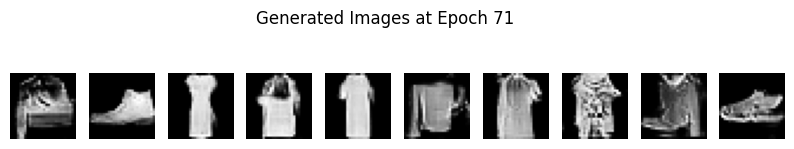

100%|██████████| 469/469 [00:17<00:00, 26.63it/s]


Epoch [71/100], d_loss: 0.6226, g_loss: 1.2323, D(x): 0.53, D(G(z)): 0.37


100%|██████████| 469/469 [00:17<00:00, 26.82it/s]


Epoch [72/100], d_loss: 0.6619, g_loss: 0.6624, D(x): 0.68, D(G(z)): 0.55


100%|██████████| 469/469 [00:17<00:00, 26.86it/s]


Epoch [73/100], d_loss: 0.6596, g_loss: 1.2762, D(x): 0.47, D(G(z)): 0.33


100%|██████████| 469/469 [00:17<00:00, 26.75it/s]


Epoch [74/100], d_loss: 0.6234, g_loss: 0.7813, D(x): 0.65, D(G(z)): 0.50


100%|██████████| 469/469 [00:17<00:00, 26.81it/s]


Epoch [75/100], d_loss: 0.6010, g_loss: 1.1158, D(x): 0.57, D(G(z)): 0.39


100%|██████████| 469/469 [00:17<00:00, 26.96it/s]


Epoch [76/100], d_loss: 0.6642, g_loss: 0.8379, D(x): 0.55, D(G(z)): 0.44


100%|██████████| 469/469 [00:17<00:00, 26.91it/s]


Epoch [77/100], d_loss: 0.6277, g_loss: 0.8048, D(x): 0.64, D(G(z)): 0.48


100%|██████████| 469/469 [00:17<00:00, 26.62it/s]


Epoch [78/100], d_loss: 0.6034, g_loss: 1.1195, D(x): 0.54, D(G(z)): 0.38


100%|██████████| 469/469 [00:17<00:00, 26.93it/s]


Epoch [79/100], d_loss: 0.6312, g_loss: 0.7142, D(x): 0.67, D(G(z)): 0.53


100%|██████████| 469/469 [00:17<00:00, 26.95it/s]


Epoch [80/100], d_loss: 0.5717, g_loss: 0.9407, D(x): 0.60, D(G(z)): 0.41


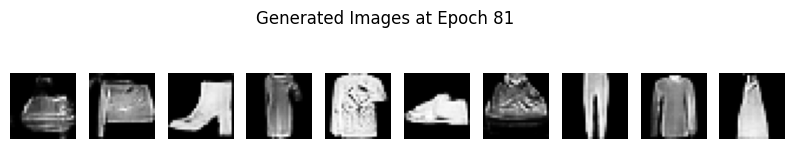

100%|██████████| 469/469 [00:17<00:00, 26.97it/s]


Epoch [81/100], d_loss: 0.5747, g_loss: 0.8850, D(x): 0.61, D(G(z)): 0.43


100%|██████████| 469/469 [00:17<00:00, 27.05it/s]


Epoch [82/100], d_loss: 0.6246, g_loss: 1.1215, D(x): 0.52, D(G(z)): 0.36


100%|██████████| 469/469 [00:17<00:00, 27.09it/s]


Epoch [83/100], d_loss: 0.5609, g_loss: 1.0043, D(x): 0.65, D(G(z)): 0.44


100%|██████████| 469/469 [00:17<00:00, 27.01it/s]


Epoch [84/100], d_loss: 0.5865, g_loss: 0.7392, D(x): 0.69, D(G(z)): 0.49


100%|██████████| 469/469 [00:17<00:00, 26.95it/s]


Epoch [85/100], d_loss: 0.6055, g_loss: 0.8386, D(x): 0.63, D(G(z)): 0.48


100%|██████████| 469/469 [00:17<00:00, 26.83it/s]


Epoch [86/100], d_loss: 0.6074, g_loss: 1.0608, D(x): 0.55, D(G(z)): 0.38


100%|██████████| 469/469 [00:17<00:00, 26.76it/s]


Epoch [87/100], d_loss: 0.6068, g_loss: 0.8188, D(x): 0.63, D(G(z)): 0.47


100%|██████████| 469/469 [00:17<00:00, 26.80it/s]


Epoch [88/100], d_loss: 0.6523, g_loss: 1.0692, D(x): 0.52, D(G(z)): 0.37


100%|██████████| 469/469 [00:17<00:00, 26.65it/s]


Epoch [89/100], d_loss: 0.6434, g_loss: 1.3588, D(x): 0.46, D(G(z)): 0.33


100%|██████████| 469/469 [00:17<00:00, 26.92it/s]


Epoch [90/100], d_loss: 0.6816, g_loss: 1.0370, D(x): 0.56, D(G(z)): 0.45


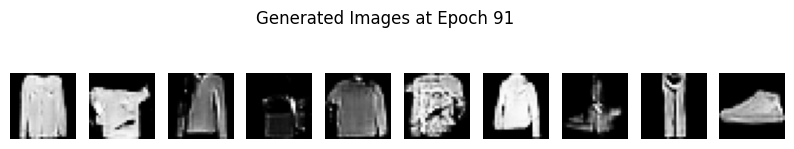

100%|██████████| 469/469 [00:17<00:00, 26.85it/s]


Epoch [91/100], d_loss: 0.6118, g_loss: 1.3827, D(x): 0.49, D(G(z)): 0.31


100%|██████████| 469/469 [00:17<00:00, 26.74it/s]


Epoch [92/100], d_loss: 0.6600, g_loss: 1.0397, D(x): 0.53, D(G(z)): 0.40


100%|██████████| 469/469 [00:17<00:00, 27.03it/s]


Epoch [93/100], d_loss: 0.6146, g_loss: 0.8563, D(x): 0.62, D(G(z)): 0.47


100%|██████████| 469/469 [00:17<00:00, 27.09it/s]


Epoch [94/100], d_loss: 0.6197, g_loss: 1.0352, D(x): 0.54, D(G(z)): 0.39


100%|██████████| 469/469 [00:17<00:00, 26.59it/s]


Epoch [95/100], d_loss: 0.6135, g_loss: 1.1477, D(x): 0.55, D(G(z)): 0.39


100%|██████████| 469/469 [00:17<00:00, 26.78it/s]


Epoch [96/100], d_loss: 0.6159, g_loss: 0.9277, D(x): 0.59, D(G(z)): 0.44


100%|██████████| 469/469 [00:17<00:00, 26.97it/s]


Epoch [97/100], d_loss: 0.5973, g_loss: 0.9960, D(x): 0.61, D(G(z)): 0.44


100%|██████████| 469/469 [00:17<00:00, 26.71it/s]


Epoch [98/100], d_loss: 0.6458, g_loss: 0.6432, D(x): 0.72, D(G(z)): 0.57


100%|██████████| 469/469 [00:17<00:00, 26.84it/s]

Epoch [99/100], d_loss: 0.6462, g_loss: 0.9903, D(x): 0.54, D(G(z)): 0.42


In [8]:
# Bucle de entrenamiento
for epoch in range(num_epochs):
    for real_images, _ in tqdm(train_loader):
        real_images = real_images.to(device)  # Move real images to the correct device

        # Reinicio gradientes del optimizador del generador
        optimizer_g.zero_grad()

        # Genero ruido aleatorio como entrada del generador
        noise = torch.randn(real_images.size(0), 100).to(device)

        # Genero imagenes falsas a partir del ruido
        fake_images = generator(noise)

        # Etiquetar todas las imágenes generadas como reales para el entrenamiento del generador
        labels = torch.ones(real_images.size(0), 1).to(device)

        # Pasar las imágenes falsas por el discriminador
        output = discriminator(fake_images)

        # Calcular la pérdida del generador
        loss_g = criterion(output, labels)
        loss_g.backward()
        optimizer_g.step()

        # Reiniciar gradientes del optimizador del discriminador
        optimizer_d.zero_grad()

        # Etiquetas para datos reales y falsos
        real_labels = torch.ones(real_images.size(0), 1).to(device)
        fake_labels = torch.zeros(real_images.size(0), 1).to(device)

        # Entrenamiento del discriminador con imágenes reales
        output_real = discriminator(real_images)

        # Calcular pérdida con imágenes reales
        loss_real = criterion(output_real, real_labels)

        # Entrenamiento del discriminador con imágenes falsas
        output_fake = discriminator(fake_images.detach())

        # Calcular pérdida con imágenes falsas
        loss_fake = criterion(output_fake, fake_labels)

        # Pérdida total del discriminador y actualización de pesos
        loss_d = (loss_real + loss_fake) / 2
        loss_d.backward()
        optimizer_d.step()

        # Guardo las pérdidas para analizar luego
        losses_g.append(g_loss.item())
        losses_d.append(d_loss.item())
        # if (i + 1) % 100 == 0:
            # Print the losses and scores
    print(f'Epoch [{epoch}/{num_epochs}], d_loss: {loss_d.item():.4f}, g_loss: {loss_g.item():.4f}, '
                  f'D(x): {output_real.mean().item():.2f}, D(G(z)): {output_fake.mean().item():.2f}')

    if epoch % 10 == 0:
        show_generated_images(epoch, generator, z_dim)


In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.title("Perdida del discriminador y el generador durante el entrenamiento")
plt.plot(losses_g.cpu(), label="G")
plt.plot(losses_d.cpu(), label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()



show_generated_images(epoch, generator, z_dim)


## CIFAR10

In [9]:
%cd /content/drive/MyDrive/Colab Notebooks/Datasets/cifar10

[Errno 2] No such file or directory: '/content/drive/MyDrive/Colab Notebooks/Datasets/cifar10'
/content


### Carga de datos

In [9]:
import torch
import torch.nn as nn
from torch.autograd import Variable
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader

In [11]:
datasets.CIFAR10('/content/drive/MyDrive/Colab Notebooks/Datasets/cifar10',download=True)

100%|██████████| 170498071/170498071 [02:29<00:00, 1140491.16it/s] 


Extracting /content/drive/MyDrive/Colab Notebooks/Datasets/cifar10/cifar-10-python.tar.gz to /content/drive/MyDrive/Colab Notebooks/Datasets/cifar10


Dataset CIFAR10
    Number of datapoints: 50000
    Root location: /content/drive/MyDrive/Colab Notebooks/Datasets/cifar10
    Split: Train

In [10]:
cifar_10_transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

z_dim = 100
# Fashion MNIST
dataset = datasets.CIFAR10(root='/content/drive/MyDrive/Colab Notebooks/Datasets/cifar10', train=True, download=False, transform=cifar_10_transform)
data_loader = DataLoader(dataset, batch_size=1024, shuffle=True)


### Modelos Generador y Discriminador

In [11]:
class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 256 * 4 * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Unflatten(1, (256, 4, 4)),

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.ConvTranspose2d(128, 128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.ConvTranspose2d(128, 128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 3, kernel_size=3, padding='same'),
            nn.Tanh()
        )

    def forward(self, z):
        return self.model(z)


In [12]:
import torch
import torch.nn as nn

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding='same'),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 128, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Flatten(),
            nn.Dropout(0.4),
            nn.Linear(256 * 4 * 4, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x)


In [13]:
import torch.optim as optim

# Load and prepare CIFAR10 training images
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])
train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=512, shuffle=True)

# Create the discriminator and generator
d_model = Discriminator()
g_model = Generator(latent_dim=z_dim)

# Optimizers
optimizer_d = optim.Adam(d_model.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_g = optim.Adam(g_model.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Loss function
criterion = nn.BCELoss()

# Device setting
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
d_model.to(device)
g_model.to(device)

100%|██████████| 170498071/170498071 [00:12<00:00, 13308144.70it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data


Generator(
  (model): Sequential(
    (0): Linear(in_features=100, out_features=4096, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Unflatten(dim=1, unflattened_size=(256, 4, 4))
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): ConvTranspose2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): ConvTranspose2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(128, 3, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (10): Tanh()
  )
)

In [14]:
import matplotlib.pyplot as plt
import numpy as np

def show_generated_images(epoch, generator, z_dim, num_images=10, image_size=64):
    z = torch.randn(num_images, z_dim).to(device)  # Adjusted to the correct shape
    with torch.no_grad():
        fake_images = generator(z)
        fake_images = fake_images.view(-1, 3, image_size, image_size)
        fake_images = (fake_images.cpu().data.numpy() + 1) / 2.0
        fake_images = np.transpose(fake_images, (0, 2, 3, 1))

    plt.figure(figsize=(10, 2))
    for i in range(num_images):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(fake_images[i])
        plt.axis('off')
    plt.suptitle(f'Generated Images at Epoch {epoch + 1}')
    plt.show()



### Bucle de entrenamiento

100%|██████████| 98/98 [00:52<00:00,  1.85it/s]


Epoch [0/100], d_loss: 0.7220321297645569, g_loss: 1.0333688259124756


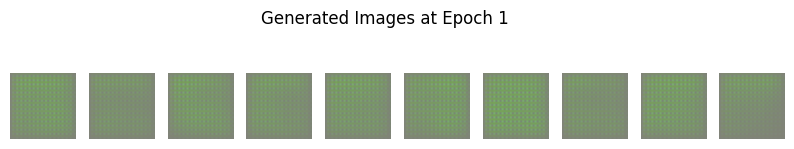

100%|██████████| 98/98 [00:52<00:00,  1.88it/s]


Epoch [1/100], d_loss: 0.07948005199432373, g_loss: 4.3738861083984375


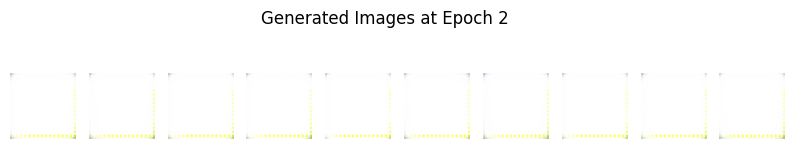

100%|██████████| 98/98 [00:51<00:00,  1.89it/s]


Epoch [2/100], d_loss: 0.011509476229548454, g_loss: 5.985217571258545


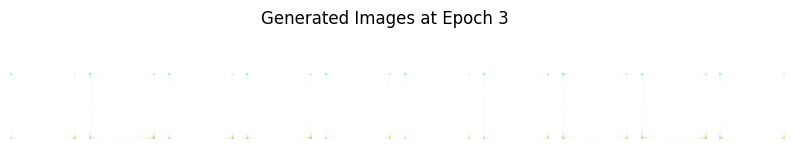

100%|██████████| 98/98 [00:51<00:00,  1.89it/s]


Epoch [3/100], d_loss: 0.15407605469226837, g_loss: 11.87486743927002


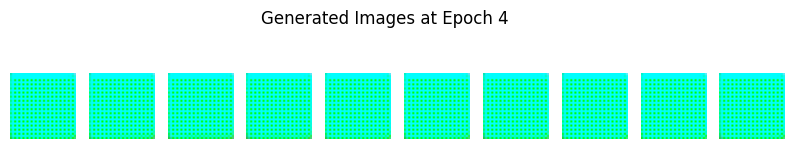

100%|██████████| 98/98 [00:52<00:00,  1.88it/s]


Epoch [4/100], d_loss: 0.005654690321534872, g_loss: 7.179884433746338


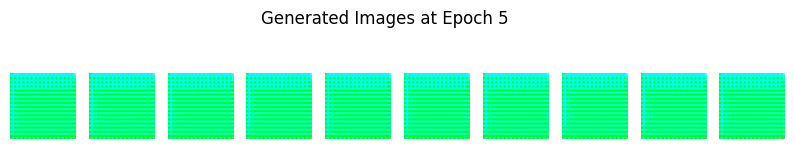

100%|██████████| 98/98 [00:52<00:00,  1.88it/s]


Epoch [5/100], d_loss: 0.0131375752389431, g_loss: 7.7240309715271


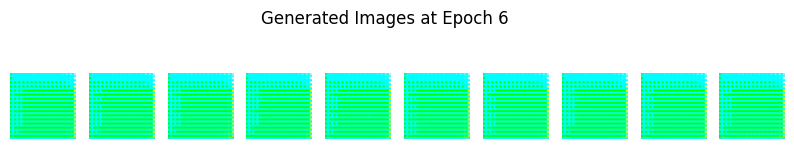

100%|██████████| 98/98 [00:51<00:00,  1.90it/s]


Epoch [6/100], d_loss: 0.010479849763214588, g_loss: 6.033736705780029


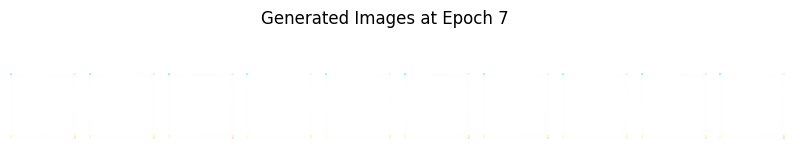

100%|██████████| 98/98 [00:51<00:00,  1.90it/s]


Epoch [7/100], d_loss: 0.001996806589886546, g_loss: 7.0827178955078125


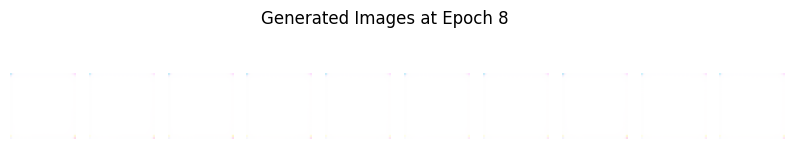

100%|██████████| 98/98 [00:51<00:00,  1.90it/s]


Epoch [8/100], d_loss: 0.00964649673551321, g_loss: 11.833900451660156


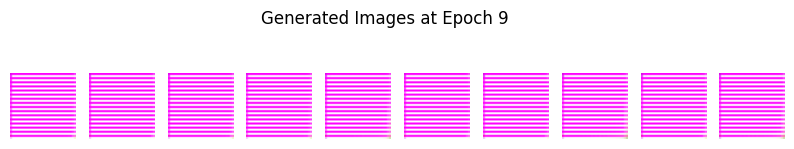

100%|██████████| 98/98 [00:51<00:00,  1.88it/s]


Epoch [9/100], d_loss: 1.2470014095306396, g_loss: 0.6566064357757568


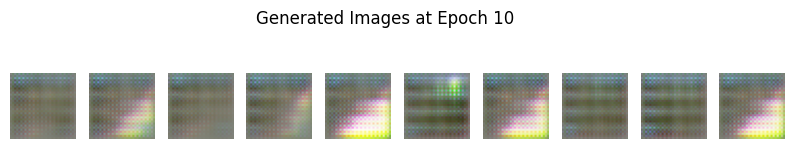

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [10/100], d_loss: 1.2881221771240234, g_loss: 1.0795066356658936


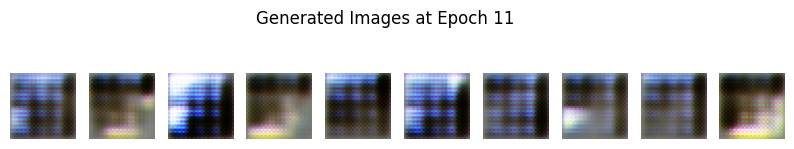

100%|██████████| 98/98 [00:52<00:00,  1.88it/s]


Epoch [11/100], d_loss: 1.1082098484039307, g_loss: 0.9903569221496582


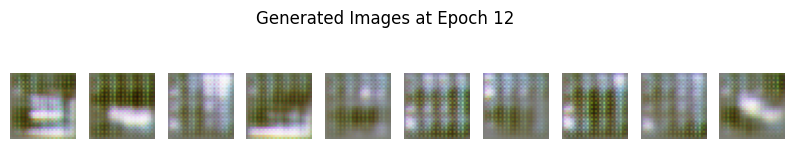

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [12/100], d_loss: 1.027317762374878, g_loss: 1.5062824487686157


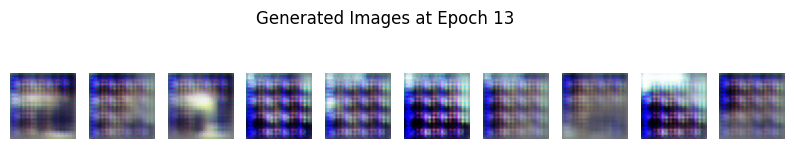

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [13/100], d_loss: 1.1580708026885986, g_loss: 0.972568690776825


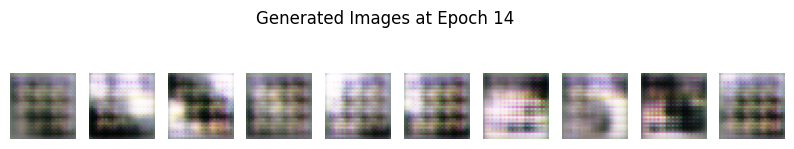

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [14/100], d_loss: 1.1053186655044556, g_loss: 1.1738592386245728


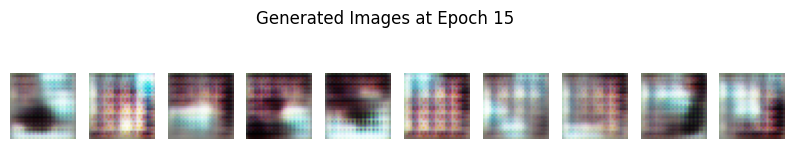

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [15/100], d_loss: 1.201602578163147, g_loss: 0.975072979927063


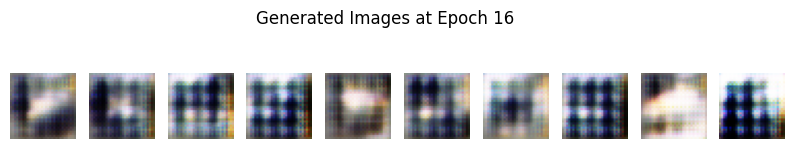

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [16/100], d_loss: 1.1131433248519897, g_loss: 1.1155911684036255


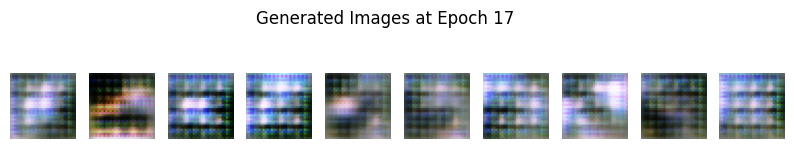

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [17/100], d_loss: 0.9483482837677002, g_loss: 1.770399570465088


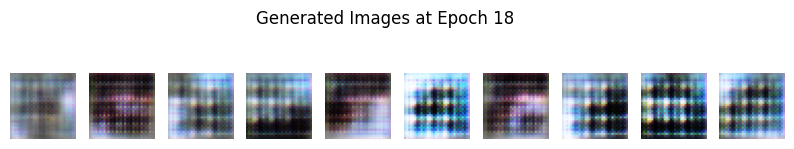

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [18/100], d_loss: 1.3364472389221191, g_loss: 0.7365847229957581


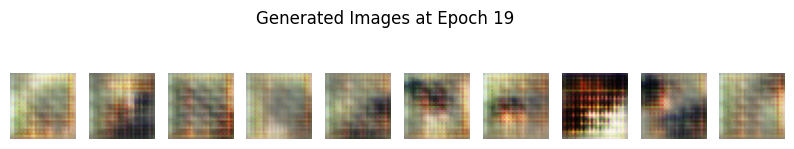

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [19/100], d_loss: 1.205224633216858, g_loss: 0.9943585991859436


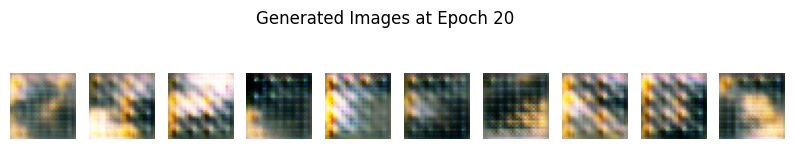

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [20/100], d_loss: 1.035614252090454, g_loss: 0.9694581031799316


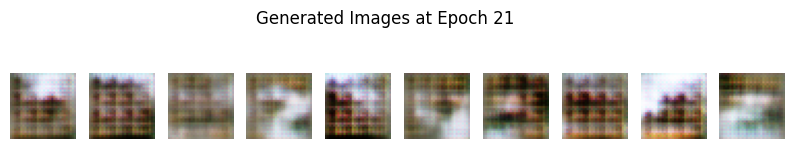

100%|██████████| 98/98 [00:52<00:00,  1.88it/s]


Epoch [21/100], d_loss: 1.339071273803711, g_loss: 1.1218111515045166


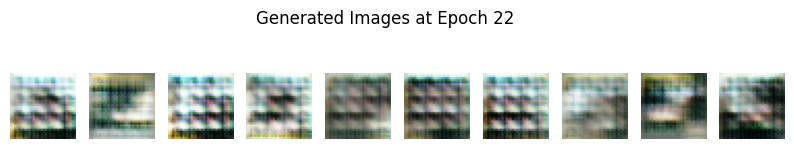

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [22/100], d_loss: 1.0787699222564697, g_loss: 1.0508034229278564


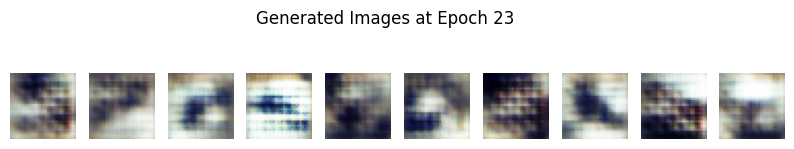

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [23/100], d_loss: 1.242610216140747, g_loss: 0.8960256576538086


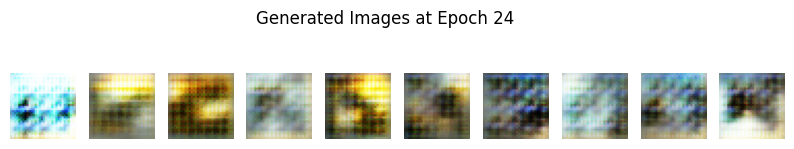

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [24/100], d_loss: 1.170186996459961, g_loss: 0.9777578711509705


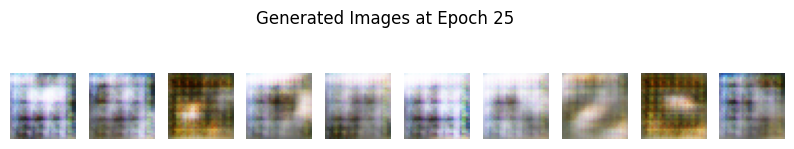

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [25/100], d_loss: 1.4900400638580322, g_loss: 0.9911701083183289


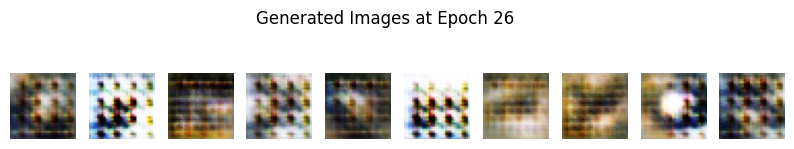

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [26/100], d_loss: 1.4032691717147827, g_loss: 0.8844030499458313


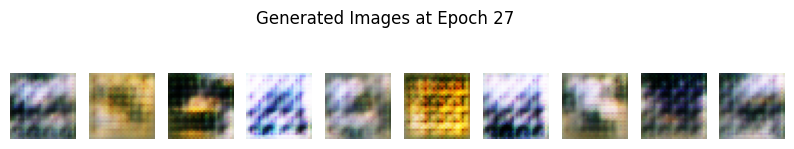

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [27/100], d_loss: 1.3736258745193481, g_loss: 1.0606905221939087


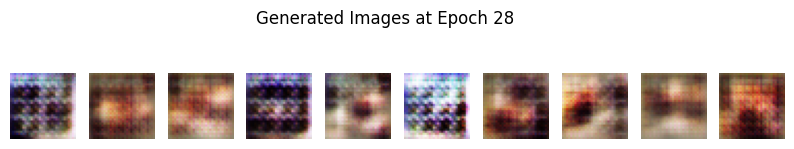

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [28/100], d_loss: 1.553985595703125, g_loss: 1.0356913805007935


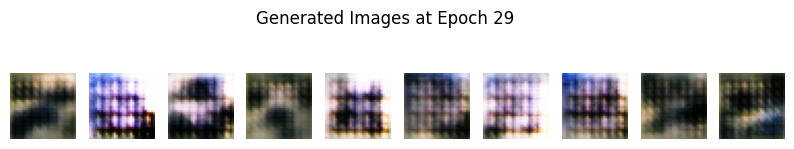

100%|██████████| 98/98 [00:52<00:00,  1.88it/s]


Epoch [29/100], d_loss: 1.340820074081421, g_loss: 1.2094508409500122


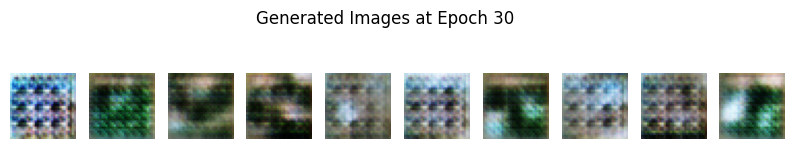

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [30/100], d_loss: 1.2535594701766968, g_loss: 1.2270774841308594


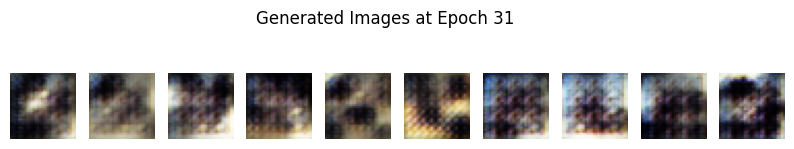

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [31/100], d_loss: 1.1757915019989014, g_loss: 1.1569724082946777


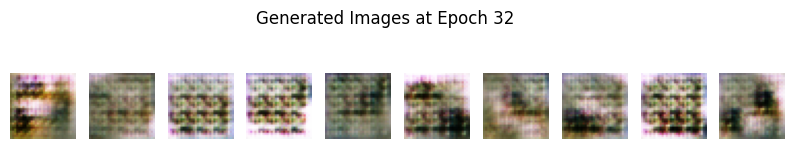

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [32/100], d_loss: 1.2841516733169556, g_loss: 0.9813448786735535


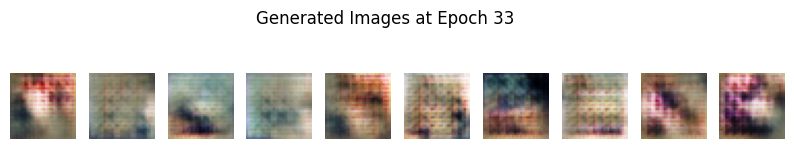

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [33/100], d_loss: 1.0377864837646484, g_loss: 1.002974271774292


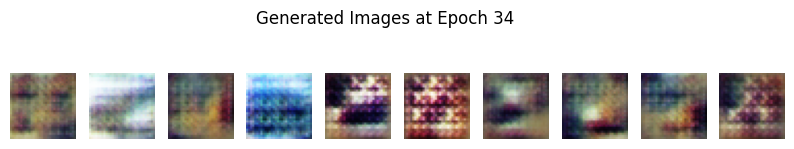

100%|██████████| 98/98 [00:52<00:00,  1.85it/s]


Epoch [34/100], d_loss: 1.1070500612258911, g_loss: 1.310686469078064


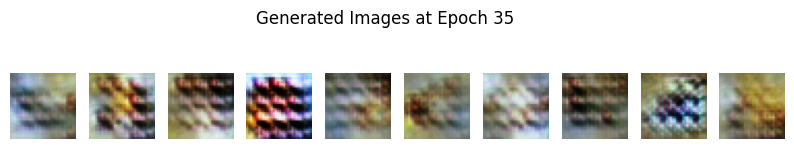

100%|██████████| 98/98 [00:52<00:00,  1.85it/s]


Epoch [35/100], d_loss: 0.9489716291427612, g_loss: 1.2265644073486328


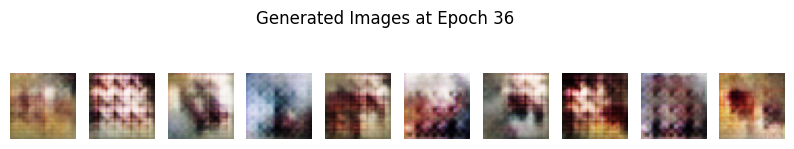

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [36/100], d_loss: 1.2167038917541504, g_loss: 1.0806270837783813


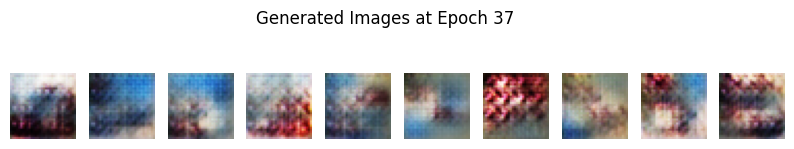

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [37/100], d_loss: 1.143369436264038, g_loss: 1.0696102380752563


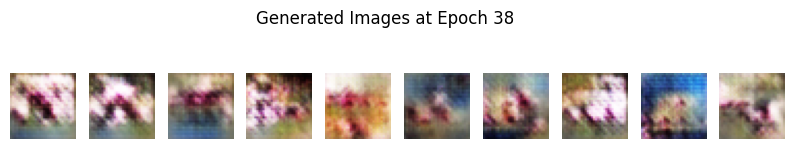

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [38/100], d_loss: 1.224076747894287, g_loss: 1.2202537059783936


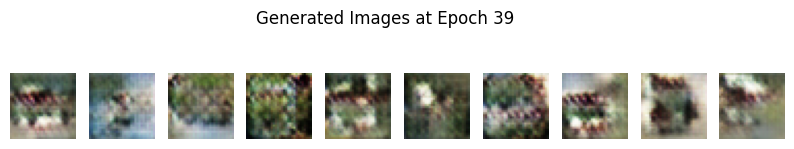

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [39/100], d_loss: 1.2602181434631348, g_loss: 1.2972753047943115


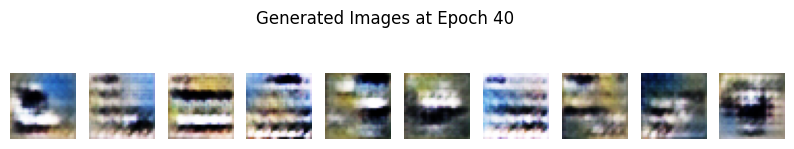

100%|██████████| 98/98 [00:52<00:00,  1.85it/s]


Epoch [40/100], d_loss: 1.229906439781189, g_loss: 1.085618257522583


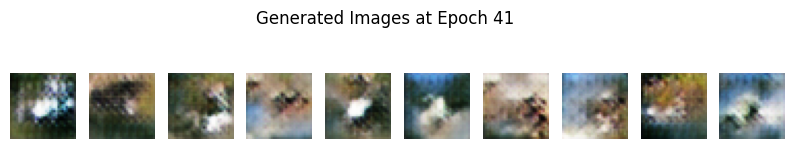

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [41/100], d_loss: 1.1277287006378174, g_loss: 1.088114619255066


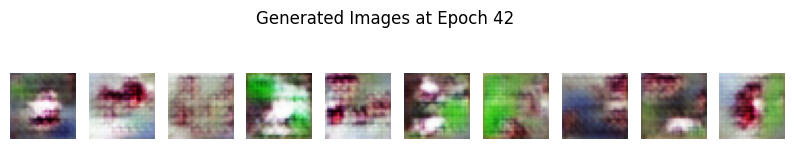

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [42/100], d_loss: 1.373913288116455, g_loss: 0.9883060455322266


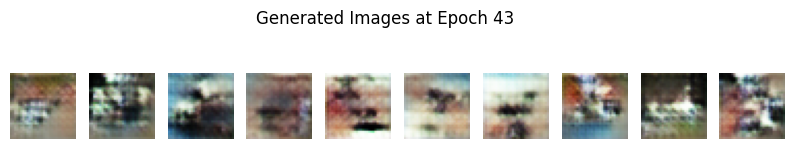

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [43/100], d_loss: 1.3024444580078125, g_loss: 1.0731658935546875


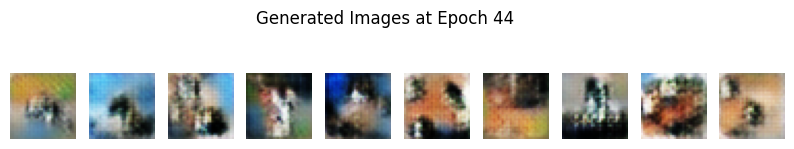

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [44/100], d_loss: 1.158370018005371, g_loss: 1.6500781774520874


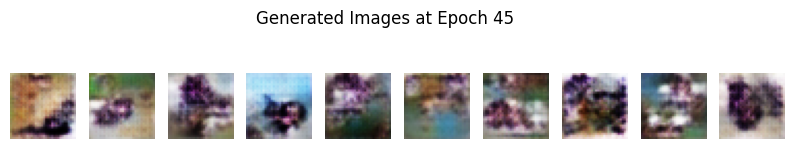

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [45/100], d_loss: 1.0724496841430664, g_loss: 1.2172966003417969


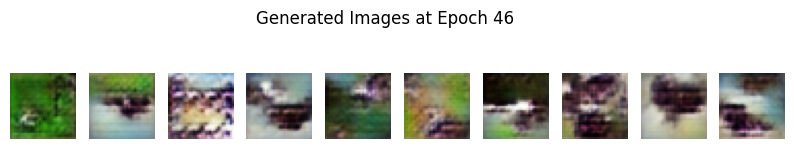

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [46/100], d_loss: 1.3162744045257568, g_loss: 0.9961831569671631


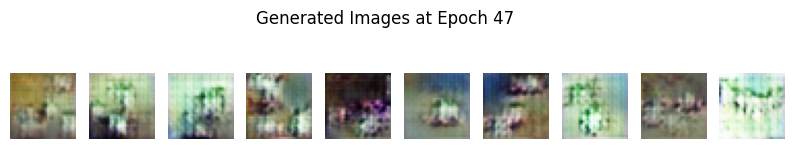

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [47/100], d_loss: 1.1867079734802246, g_loss: 1.0258913040161133


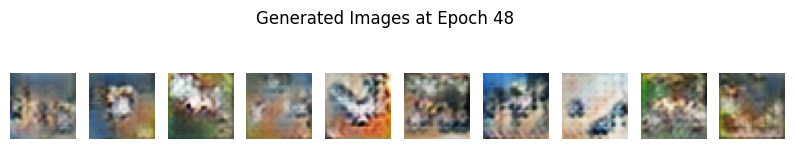

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [48/100], d_loss: 1.2983533143997192, g_loss: 0.9355997443199158


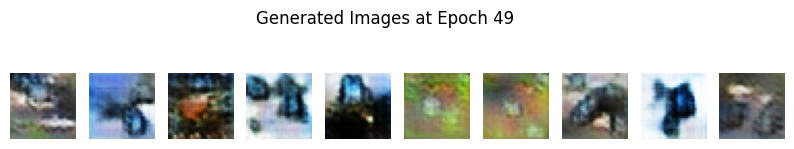

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [49/100], d_loss: 1.019834041595459, g_loss: 1.0516530275344849


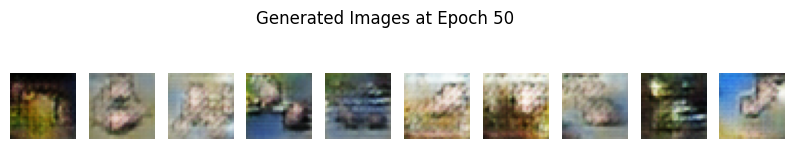

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [50/100], d_loss: 1.1505188941955566, g_loss: 1.1378223896026611


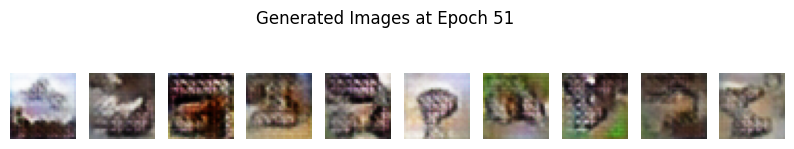

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [51/100], d_loss: 1.2430689334869385, g_loss: 1.030510663986206


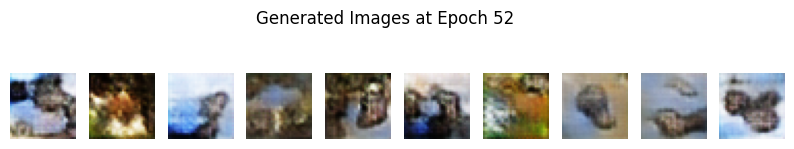

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [52/100], d_loss: 1.2599351406097412, g_loss: 0.8651964068412781


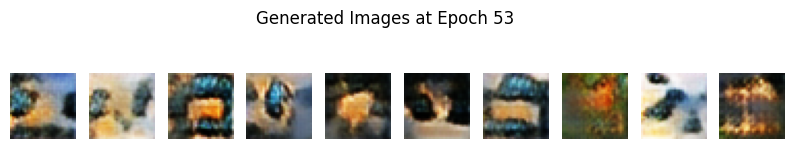

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [53/100], d_loss: 1.2687010765075684, g_loss: 0.8576793074607849


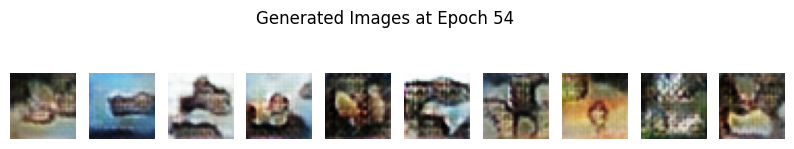

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [54/100], d_loss: 1.3487732410430908, g_loss: 0.8845266699790955


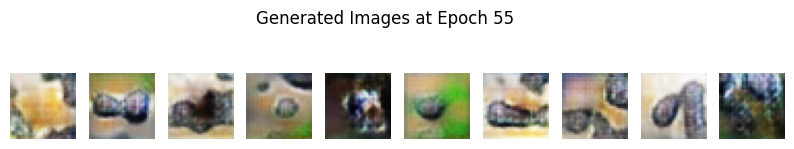

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [55/100], d_loss: 1.1949310302734375, g_loss: 0.9401602149009705


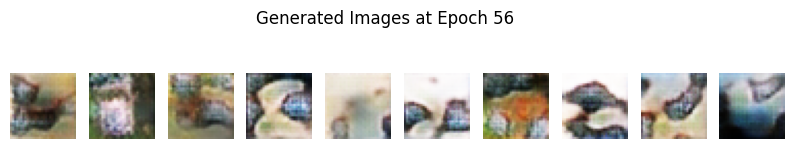

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [56/100], d_loss: 1.2529226541519165, g_loss: 1.0084658861160278


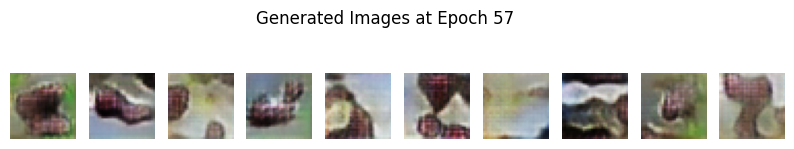

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [57/100], d_loss: 1.188723087310791, g_loss: 0.9457774758338928


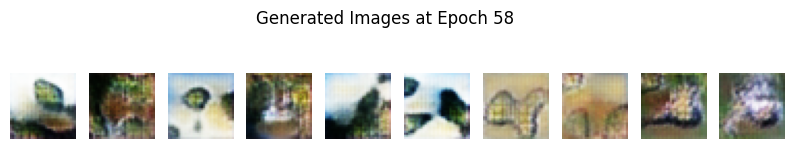

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [58/100], d_loss: 1.1671404838562012, g_loss: 0.9260964393615723


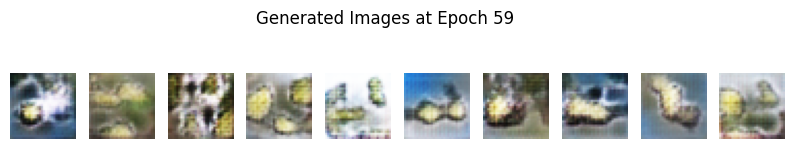

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [59/100], d_loss: 1.279030442237854, g_loss: 0.8875068426132202


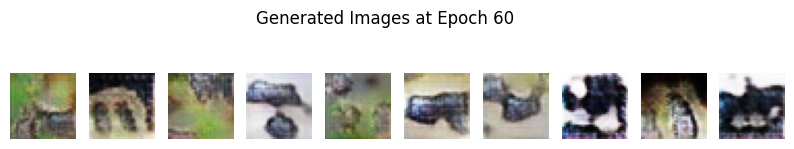

100%|██████████| 98/98 [00:52<00:00,  1.88it/s]


Epoch [60/100], d_loss: 1.1750833988189697, g_loss: 0.8759847283363342


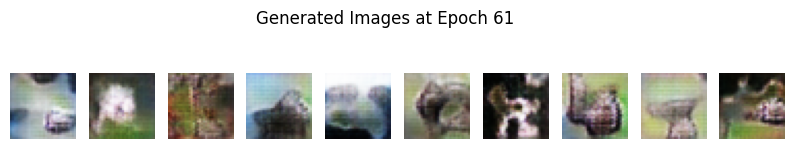

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [61/100], d_loss: 1.2837605476379395, g_loss: 0.9701946973800659


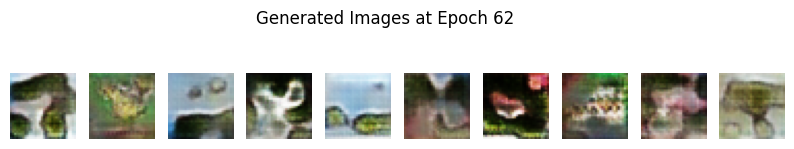

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [62/100], d_loss: 1.0544462203979492, g_loss: 0.9070683717727661


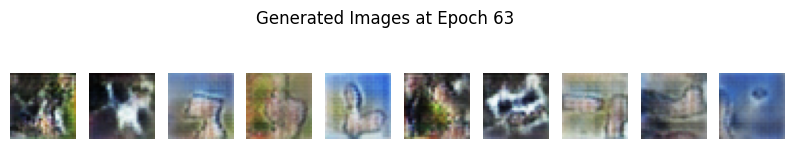

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [63/100], d_loss: 1.1782505512237549, g_loss: 0.9373229146003723


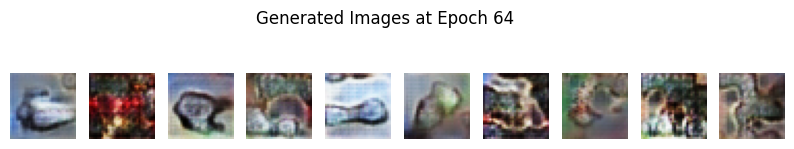

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [64/100], d_loss: 1.3127914667129517, g_loss: 1.0488581657409668


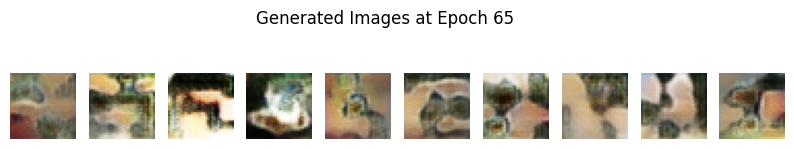

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [65/100], d_loss: 1.2282297611236572, g_loss: 0.8565316200256348


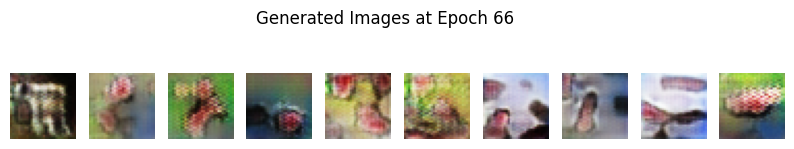

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [66/100], d_loss: 1.267418622970581, g_loss: 0.862602710723877


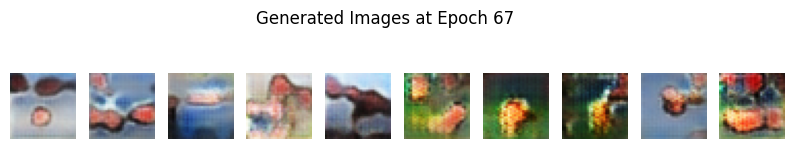

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [67/100], d_loss: 1.3243730068206787, g_loss: 0.9631340503692627


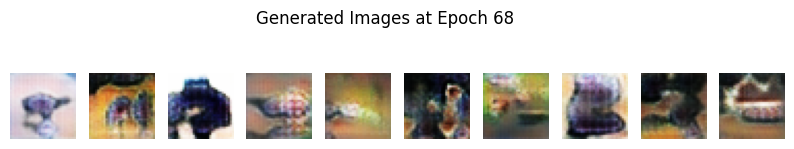

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [68/100], d_loss: 1.2044107913970947, g_loss: 1.4260737895965576


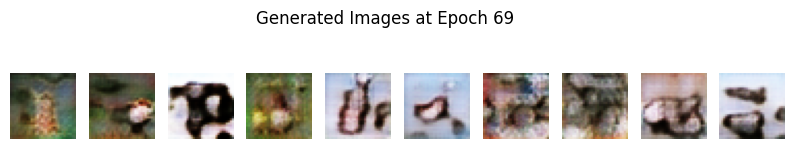

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [69/100], d_loss: 1.2117886543273926, g_loss: 0.8885787129402161


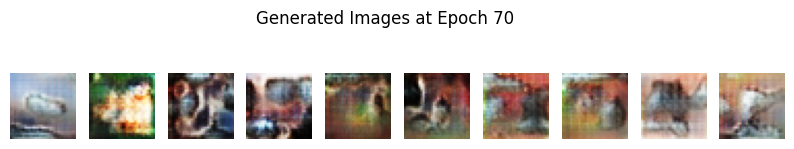

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [70/100], d_loss: 1.2374955415725708, g_loss: 1.0330256223678589


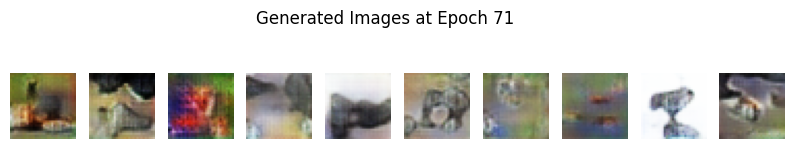

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [71/100], d_loss: 1.2314741611480713, g_loss: 0.875793993473053


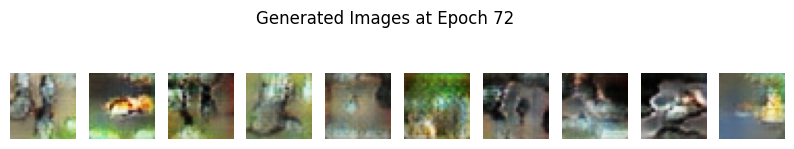

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [72/100], d_loss: 1.3125489950180054, g_loss: 0.8069783449172974


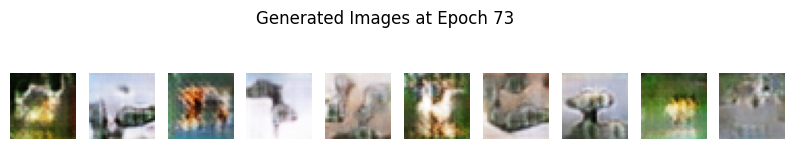

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [73/100], d_loss: 1.2299301624298096, g_loss: 1.1675163507461548


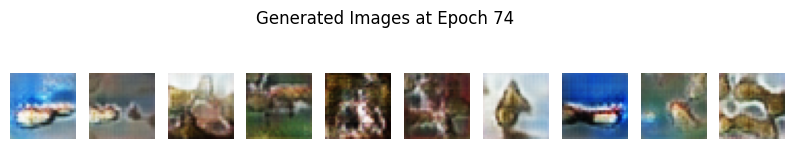

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [74/100], d_loss: 1.296196699142456, g_loss: 0.9834131002426147


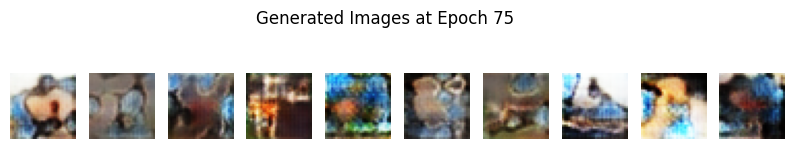

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [75/100], d_loss: 1.1839905977249146, g_loss: 1.012924075126648


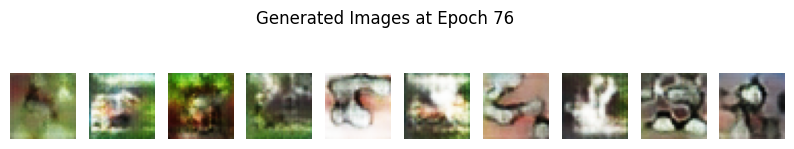

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [76/100], d_loss: 1.222503662109375, g_loss: 1.1418843269348145


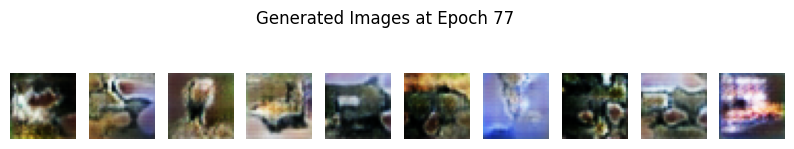

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [77/100], d_loss: 1.2425401210784912, g_loss: 1.0049864053726196


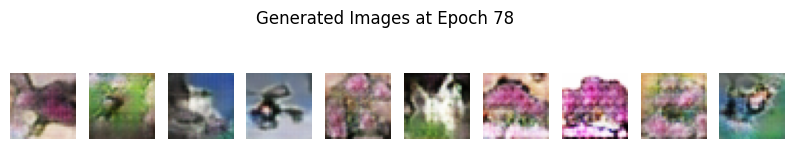

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [78/100], d_loss: 1.1507163047790527, g_loss: 0.9908252954483032


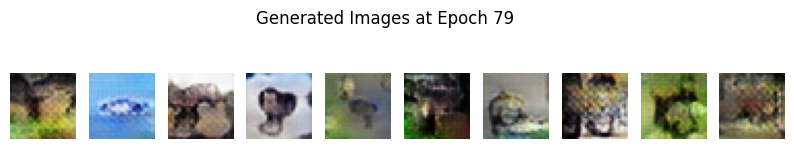

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [79/100], d_loss: 1.427251935005188, g_loss: 1.0019564628601074


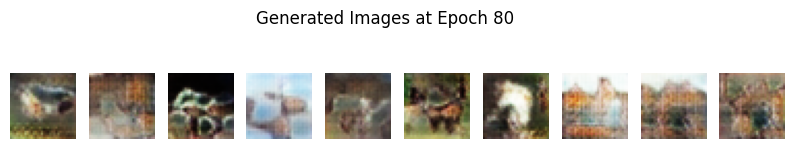

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [80/100], d_loss: 1.2995208501815796, g_loss: 0.9997549653053284


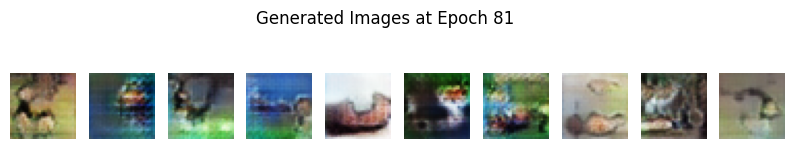

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [81/100], d_loss: 1.2450095415115356, g_loss: 1.0341607332229614


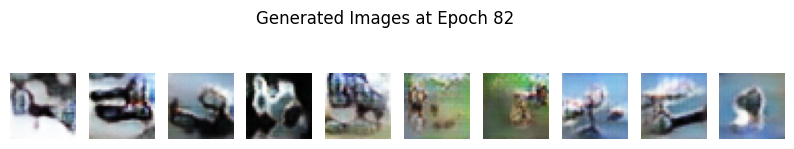

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [82/100], d_loss: 1.3508720397949219, g_loss: 1.414974570274353


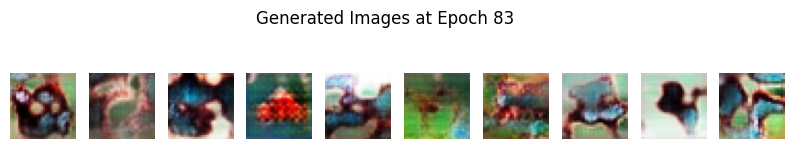

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [83/100], d_loss: 1.2376203536987305, g_loss: 0.9890434145927429


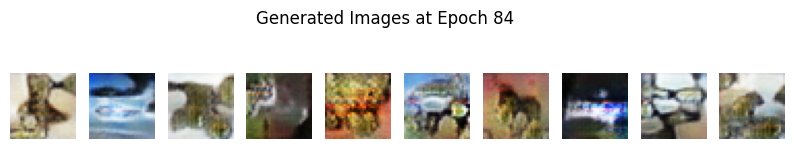

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [84/100], d_loss: 1.2422465085983276, g_loss: 0.7910944819450378


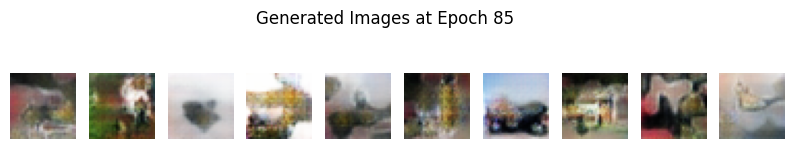

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [85/100], d_loss: 1.2914998531341553, g_loss: 0.9084018468856812


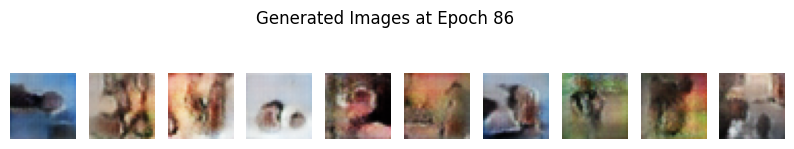

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [86/100], d_loss: 1.3185758590698242, g_loss: 1.1107268333435059


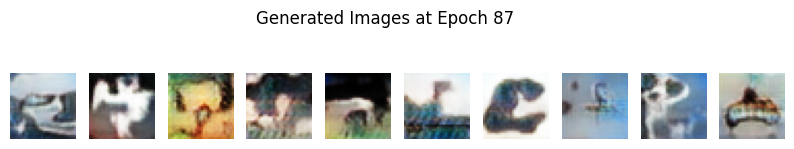

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [87/100], d_loss: 1.3254278898239136, g_loss: 1.0399729013442993


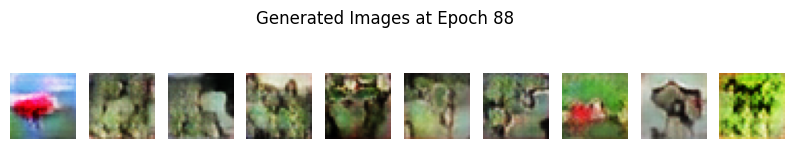

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [88/100], d_loss: 1.1904411315917969, g_loss: 0.8529340624809265


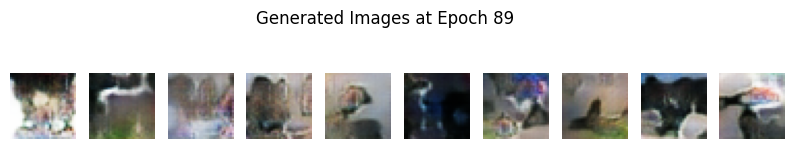

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [89/100], d_loss: 1.3406710624694824, g_loss: 1.0677393674850464


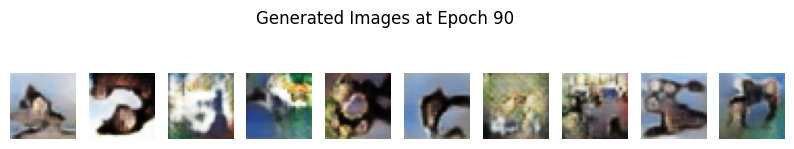

100%|██████████| 98/98 [00:52<00:00,  1.87it/s]


Epoch [90/100], d_loss: 1.272559404373169, g_loss: 0.9986681342124939


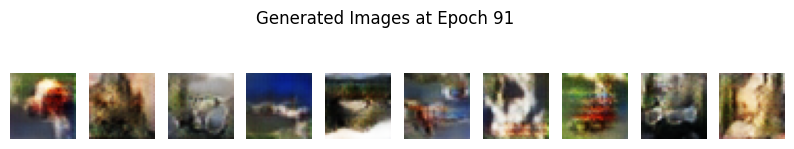

100%|██████████| 98/98 [00:52<00:00,  1.85it/s]


Epoch [91/100], d_loss: 1.261199951171875, g_loss: 1.035215139389038


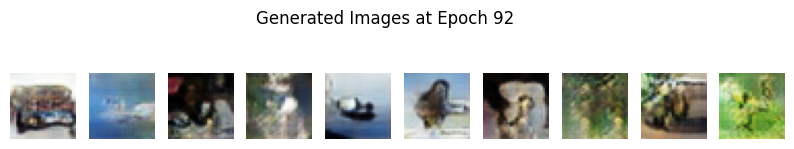

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [92/100], d_loss: 1.2667970657348633, g_loss: 0.9292277693748474


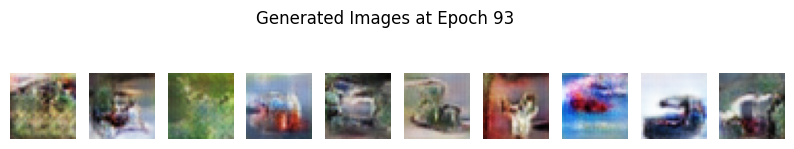

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [93/100], d_loss: 1.2064800262451172, g_loss: 0.9406368136405945


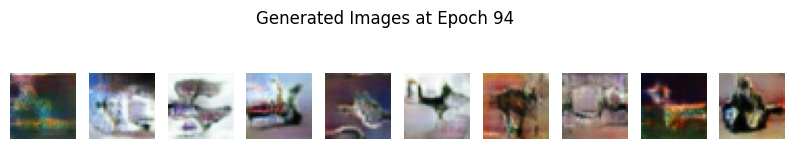

100%|██████████| 98/98 [00:52<00:00,  1.85it/s]


Epoch [94/100], d_loss: 1.302371859550476, g_loss: 0.9061679840087891


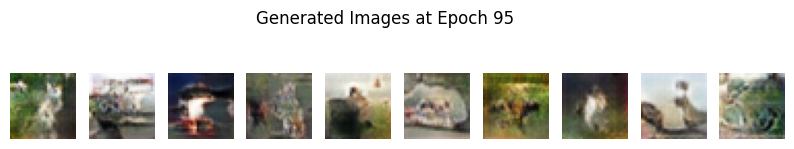

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [95/100], d_loss: 1.2208638191223145, g_loss: 0.9364522695541382


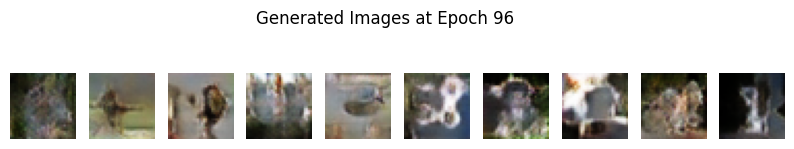

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [96/100], d_loss: 1.0972223281860352, g_loss: 1.2431060075759888


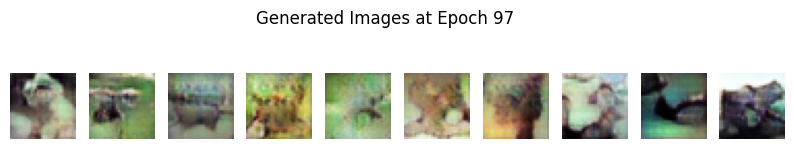

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [97/100], d_loss: 1.2249096632003784, g_loss: 1.2202506065368652


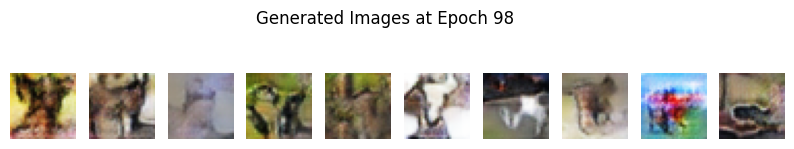

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [98/100], d_loss: 1.2280640602111816, g_loss: 0.9341922402381897


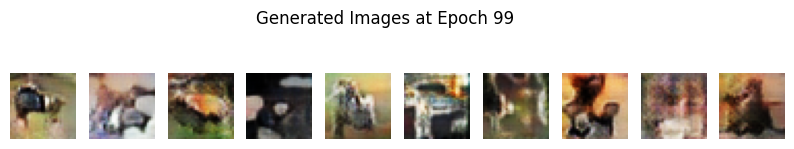

100%|██████████| 98/98 [00:52<00:00,  1.86it/s]


Epoch [99/100], d_loss: 1.1603972911834717, g_loss: 0.9438925385475159


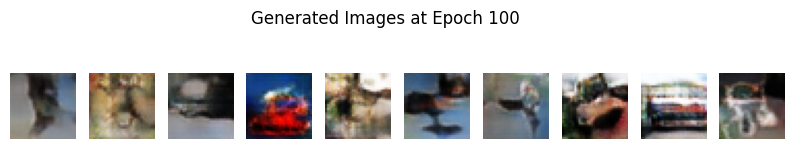

In [19]:
num_epochs = 100
z_dim = 100
# Bucle de entrenamiento para CIFAR10 DCGAN
losses_g = []
losses_d = []
for epoch in range(num_epochs):
    # for i, (real_images, _) in enumerate(train_loader):
    for real_images, _ in tqdm(train_loader):#in enumerate(train_loader):

        # Preparo el tamaño del batch y muevo imágenes a la GPU

        real_images = real_images.to(device)
        batch_size = real_images.size(0)

        # Creo etiquetas para datos reales (1) y falsos (0)
        real_labels = torch.ones(batch_size, 1, device=device)
        fake_labels = torch.zeros(batch_size, 1, device=device)

        # ===== Entrenamiento del Discriminador =====
        # Reseteo gradientes del discriminador
        optimizer_d.zero_grad()
        outputs = d_model(real_images)

        # Calculo la pérdida del discriminador con imágenes reales
        d_loss_real = criterion(outputs, real_labels)
        d_loss_real.backward()

        # Genero datos falsos (imágenes)
        z = torch.randn(batch_size, 100, device=device)
        fake_images = g_model(z)

        # Calculo la pérdida del discriminador con imágenes falsas
        outputs = d_model(fake_images.detach())
        d_loss_fake = criterion(outputs, fake_labels)
        d_loss_fake.backward()

        # Actualizo los pesos del discriminador
        optimizer_d.step()

        # Calculo la pérdida total del discriminador
        d_loss = d_loss_real + d_loss_fake

        # ===== Entrenamiento del Generador =====
        # Reseteo gradientes del generador
        g_model.zero_grad()

        # Genero salida del discriminador para imágenes falsas
        outputs = d_model(fake_images)

        # Calculo la pérdida del generador (intentando que el discriminador clasifique las imágenes falsas como reales)
        g_loss = criterion(outputs, real_labels)
        g_loss.backward()

        # Actualizo los pesos del generador
        optimizer_g.step()

        # Guardo las pérdidas para analizar luego
        losses_g.append(g_loss.item())
        losses_d.append(d_loss.item())

        # if (i + 1) % 50 == 0:
            # print(f'Epoch [{epoch}/{num_epochs}], Step [{i+1}/{len(train_loader)}], d_loss: {d_loss.item()}, g_loss: {g_loss.item()}')
    print(f'Epoch [{epoch}/{num_epochs}], d_loss: {d_loss.item()}, g_loss: {g_loss.item()}')

            # with torch.no_grad():
            #     # fake_images = g_model(torch.randn(49, 100, device=device))
    show_generated_images(epoch, g_model, z_dim=z_dim, num_images=10, image_size=32)

                # save_plot(fake_images, epoch)



In [ ]:
import os

os._exit(0)

## CelebA

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Carga de datos

In [ ]:
import torchvision.datasets

torchvision.datasets.CelebA("content/celeb_a",download = True)

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Subset
import matplotlib.pyplot as plt
import numpy as np
import random

random.seed(43)
torch.manual_seed(43)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Transformaciones para el dataset CelebA
transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])


celeba_path_folder = '/content/drive/MyDrive/Colab Notebooks/Datasets/celeba/'

# Cargar el dataset completo
full_dataset = datasets.ImageFolder(root=celeba_path_folder, transform=transform)

# Definir el tamaño del subconjunto
subset_size = 5000  # Por ejemplo, 20,000 imágenes
indices = list(range(len(full_dataset)))
subset_indices = indices[:subset_size]

# Crear el subconjunto
subset_dataset = Subset(full_dataset, subset_indices)

# DataLoader para el subconjunto
data_loader = DataLoader(subset_dataset, batch_size=256, shuffle=True, num_workers=2)


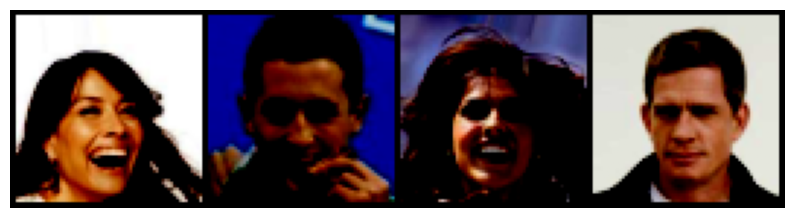

In [4]:
import matplotlib.pyplot as plt
import torchvision

def show_selected_images(images_batch, num_images=4):
    """
    Muestra un numero dado de images del batch.
    """
    if num_images > len(images_batch):
        raise ValueError("El numero de imagenes es mas grande que el tamaño del batch.")

    selected_images = images_batch[:num_images]
    grid = torchvision.utils.make_grid(selected_images, nrow=num_images)
    plt.figure(figsize=(10, 5))
    plt.imshow(grid.numpy().transpose((1, 2, 0)))
    plt.axis('off')
    plt.show()

data_iter = iter(data_loader)
images_batch, _ = next(data_iter)

show_selected_images(images_batch, num_images=4)



### Modelos Generador y Discriminador

In [5]:
class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            # Capa de entrada: Genera un volumen a partir del espacio latente
            nn.ConvTranspose2d(latent_dim, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            # Capa transpuesta: 512 -> 256
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            # Capa transpuesta: 256 -> 128
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            # Capa transpuesta: 128 -> 64
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            # Capa de salida: 64 -> 3 (RGB)
            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()  # Tanh para obtener valores de píxeles en el rango [-1, 1]
        )

    def forward(self, z):
        return self.model(z)


In [6]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            # Capa de entrada: 3 (RGB) -> 64
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            # Capa: 64 -> 128
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            # Capa: 128 -> 256
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            # Capa: 256 -> 512
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            # Capa de salida: 512 -> 1
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()  # Sigmoid para obtener una probabilidad
        )

    def forward(self, x):
        return self.model(x)


In [7]:
def init_normal(m):
    classname = m.__class__.__name__

    # Inicializar las capas convolucionales
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)

    # Inicializar las capas de normalización por lotes
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [8]:
generator = Generator(latent_dim=100).to(device)
discriminator = Discriminator().to(device)

# Aplicar la inicialización de pesos
generator.apply(init_normal)
discriminator.apply(init_normal)


Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [9]:
def show_generated_images(epoch, generator, z_dim, num_images=10, image_size=64):
    z = torch.randn(num_images, z_dim, 1, 1).to(device)
    with torch.no_grad():
        fake_images = generator(z)
        fake_images = fake_images.view(-1, 3, image_size, image_size)
        fake_images = (fake_images.cpu().data.numpy() + 1) / 2.0
        fake_images = np.transpose(fake_images, (0, 2, 3, 1))

    plt.figure(figsize=(10, 2))
    for i in range(num_images):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(fake_images[i])
        plt.axis('off')
    plt.suptitle(f'Generated Images at Epoch {epoch + 1}')
    plt.show()


### Bucle de entrenamiento

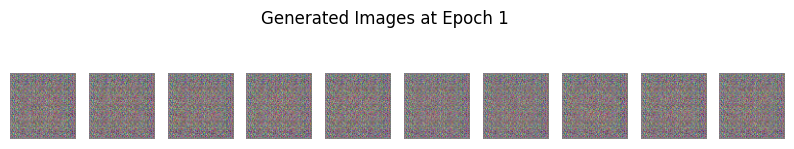

Epoch [5/1000], d_loss: 2.6318821907043457, g_loss: 16.361217498779297
Epoch [10/1000], d_loss: 0.6257972121238708, g_loss: 4.209939479827881
Epoch [15/1000], d_loss: 1.1413168907165527, g_loss: 2.060811758041382
Epoch [20/1000], d_loss: 0.9052376747131348, g_loss: 2.007364511489868
Epoch [25/1000], d_loss: 0.3586385250091553, g_loss: 3.754908800125122
Epoch [30/1000], d_loss: 0.6760653257369995, g_loss: 6.0217061042785645
Epoch [35/1000], d_loss: 0.6561596393585205, g_loss: 5.554637908935547
Epoch [40/1000], d_loss: 1.0257797241210938, g_loss: 1.0187290906906128
Epoch [45/1000], d_loss: 0.5132449865341187, g_loss: 5.40166711807251
Epoch [50/1000], d_loss: 0.44226619601249695, g_loss: 6.122130393981934


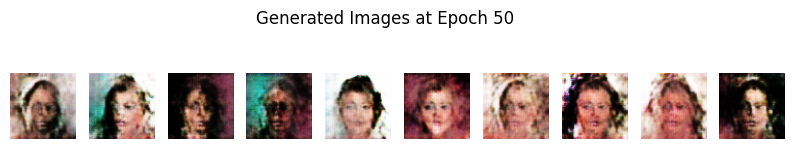

Epoch [55/1000], d_loss: 0.32394248247146606, g_loss: 4.92508602142334
Epoch [60/1000], d_loss: 1.8710352182388306, g_loss: 8.731968879699707
Epoch [65/1000], d_loss: 0.480963796377182, g_loss: 3.1762092113494873
Epoch [70/1000], d_loss: 0.8570841550827026, g_loss: 1.0367326736450195
Epoch [75/1000], d_loss: 0.5682072639465332, g_loss: 3.0320096015930176
Epoch [80/1000], d_loss: 0.41993361711502075, g_loss: 2.6346800327301025
Epoch [85/1000], d_loss: 0.4535060524940491, g_loss: 4.993296146392822
Epoch [90/1000], d_loss: 0.3229837119579315, g_loss: 3.539457321166992
Epoch [95/1000], d_loss: 0.35025113821029663, g_loss: 3.625319004058838
Epoch [100/1000], d_loss: 0.47487205266952515, g_loss: 1.8870351314544678


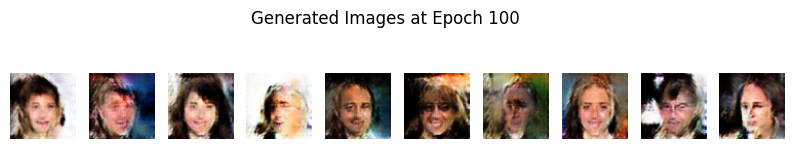

Epoch [105/1000], d_loss: 0.3430599868297577, g_loss: 3.8184545040130615
Epoch [110/1000], d_loss: 0.45797199010849, g_loss: 2.3916189670562744
Epoch [115/1000], d_loss: 0.43104010820388794, g_loss: 3.446359634399414
Epoch [120/1000], d_loss: 0.4602413773536682, g_loss: 2.7232279777526855
Epoch [125/1000], d_loss: 0.5746620893478394, g_loss: 4.153593063354492
Epoch [130/1000], d_loss: 0.6620007753372192, g_loss: 2.3397207260131836
Epoch [135/1000], d_loss: 0.42626094818115234, g_loss: 2.7232306003570557
Epoch [140/1000], d_loss: 0.33389800786972046, g_loss: 2.967608690261841
Epoch [145/1000], d_loss: 0.33872801065444946, g_loss: 2.710010290145874
Epoch [150/1000], d_loss: 2.062006950378418, g_loss: 6.359621047973633


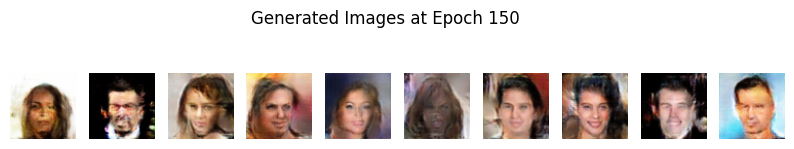

Epoch [155/1000], d_loss: 0.505521297454834, g_loss: 2.4444217681884766
Epoch [160/1000], d_loss: 0.44066059589385986, g_loss: 1.8163987398147583
Epoch [165/1000], d_loss: 2.3683273792266846, g_loss: 0.08111809939146042
Epoch [170/1000], d_loss: 0.43878549337387085, g_loss: 2.644951105117798
Epoch [175/1000], d_loss: 0.497832715511322, g_loss: 2.150141954421997
Epoch [180/1000], d_loss: 0.3839985132217407, g_loss: 3.62589168548584
Epoch [185/1000], d_loss: 0.9991387724876404, g_loss: 1.4520591497421265
Epoch [190/1000], d_loss: 0.42131033539772034, g_loss: 2.7541732788085938
Epoch [195/1000], d_loss: 0.5277966260910034, g_loss: 2.236147403717041
Epoch [200/1000], d_loss: 0.45790719985961914, g_loss: 1.8955203294754028


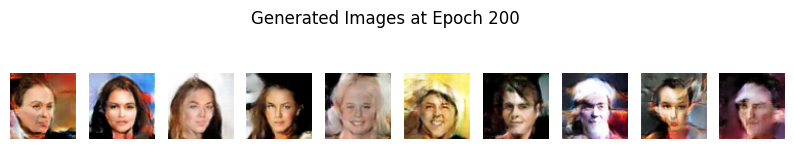

Epoch [205/1000], d_loss: 0.3146913945674896, g_loss: 2.4360320568084717
Epoch [210/1000], d_loss: 0.5007500648498535, g_loss: 1.734130620956421
Epoch [215/1000], d_loss: 2.6991586685180664, g_loss: 0.5797439217567444
Epoch [220/1000], d_loss: 0.2908628284931183, g_loss: 3.3206005096435547
Epoch [225/1000], d_loss: 0.3278365135192871, g_loss: 2.2703371047973633
Epoch [230/1000], d_loss: 0.7430247068405151, g_loss: 4.477473735809326
Epoch [235/1000], d_loss: 0.28688058257102966, g_loss: 3.194103956222534
Epoch [240/1000], d_loss: 0.45507189631462097, g_loss: 2.9482102394104004
Epoch [245/1000], d_loss: 2.6296494007110596, g_loss: 0.13654927909374237
Epoch [250/1000], d_loss: 0.43046870827674866, g_loss: 1.3876214027404785


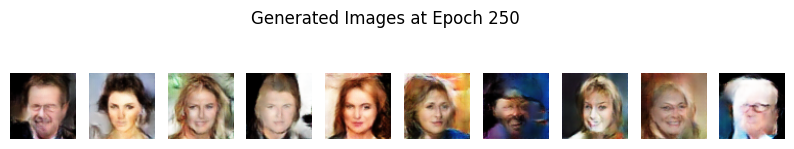

Epoch [255/1000], d_loss: 0.29553869366645813, g_loss: 2.812267303466797
Epoch [260/1000], d_loss: 0.40289032459259033, g_loss: 3.250277280807495
Epoch [265/1000], d_loss: 0.20360812544822693, g_loss: 2.8919174671173096
Epoch [270/1000], d_loss: 0.20512327551841736, g_loss: 3.815356969833374
Epoch [275/1000], d_loss: 0.19431450963020325, g_loss: 3.5335750579833984
Epoch [280/1000], d_loss: 0.4309225082397461, g_loss: 4.527738571166992
Epoch [285/1000], d_loss: 0.2026645839214325, g_loss: 2.712428569793701
Epoch [290/1000], d_loss: 0.2247788906097412, g_loss: 2.7425410747528076
Epoch [295/1000], d_loss: 0.19007030129432678, g_loss: 3.3694000244140625
Epoch [300/1000], d_loss: 0.3918250799179077, g_loss: 4.375482082366943


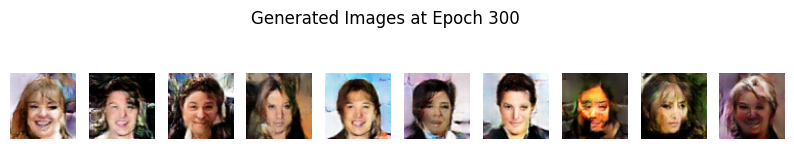

Epoch [305/1000], d_loss: 0.15033897757530212, g_loss: 3.484300136566162
Epoch [310/1000], d_loss: 0.27026841044425964, g_loss: 5.464489459991455
Epoch [315/1000], d_loss: 0.1798144280910492, g_loss: 3.7646586894989014
Epoch [320/1000], d_loss: 0.13539078831672668, g_loss: 3.4414055347442627
Epoch [325/1000], d_loss: 2.7764647006988525, g_loss: 5.686840534210205
Epoch [330/1000], d_loss: 0.16524812579154968, g_loss: 3.155162811279297
Epoch [335/1000], d_loss: 0.08676610887050629, g_loss: 4.141322612762451
Epoch [340/1000], d_loss: 0.1440838873386383, g_loss: 4.1378912925720215
Epoch [345/1000], d_loss: 1.8040610551834106, g_loss: 2.3226609230041504
Epoch [350/1000], d_loss: 1.3062673807144165, g_loss: 2.239828109741211


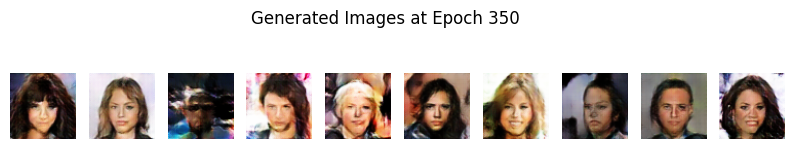

Epoch [355/1000], d_loss: 0.19019636511802673, g_loss: 3.722137451171875
Epoch [360/1000], d_loss: 0.16559213399887085, g_loss: 4.014720439910889
Epoch [365/1000], d_loss: 0.1386474370956421, g_loss: 3.7969329357147217
Epoch [370/1000], d_loss: 0.14049917459487915, g_loss: 4.42859411239624
Epoch [375/1000], d_loss: 0.08764447271823883, g_loss: 3.76840877532959
Epoch [380/1000], d_loss: 0.299973726272583, g_loss: 3.3837454319000244
Epoch [385/1000], d_loss: 0.11794759333133698, g_loss: 3.9064204692840576
Epoch [390/1000], d_loss: 0.10850091278553009, g_loss: 3.5876829624176025
Epoch [395/1000], d_loss: 0.08733603358268738, g_loss: 3.9188597202301025
Epoch [400/1000], d_loss: 0.17829108238220215, g_loss: 2.0359323024749756


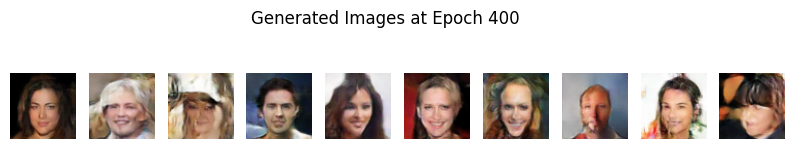

Epoch [405/1000], d_loss: 0.1932375729084015, g_loss: 3.7536613941192627
Epoch [410/1000], d_loss: 0.09792055189609528, g_loss: 3.71695613861084
Epoch [415/1000], d_loss: 0.11096951365470886, g_loss: 3.444689989089966
Epoch [420/1000], d_loss: 0.08721765875816345, g_loss: 3.5783629417419434
Epoch [425/1000], d_loss: 0.11872352659702301, g_loss: 4.014950752258301
Epoch [430/1000], d_loss: 1.7226128578186035, g_loss: 1.3566982746124268
Epoch [435/1000], d_loss: 0.31483644247055054, g_loss: 3.2803080081939697
Epoch [440/1000], d_loss: 0.09364716708660126, g_loss: 4.192437648773193
Epoch [445/1000], d_loss: 0.7716968655586243, g_loss: 3.731323719024658
Epoch [450/1000], d_loss: 0.100357785820961, g_loss: 4.015105247497559


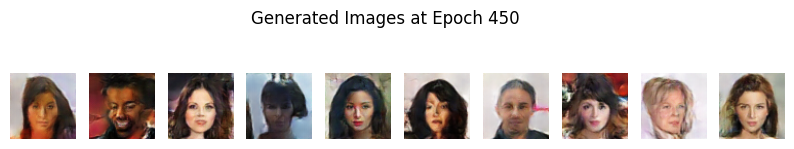

Epoch [455/1000], d_loss: 0.05986707657575607, g_loss: 4.4798502922058105
Epoch [460/1000], d_loss: 0.06252134591341019, g_loss: 4.102801322937012
Epoch [465/1000], d_loss: 0.08636608719825745, g_loss: 3.724275827407837
Epoch [470/1000], d_loss: 0.06772361695766449, g_loss: 4.4269819259643555
Epoch [475/1000], d_loss: 1.4149469137191772, g_loss: 0.9523629546165466
Epoch [480/1000], d_loss: 0.22100958228111267, g_loss: 3.6231141090393066
Epoch [485/1000], d_loss: 0.10860344022512436, g_loss: 3.6672370433807373
Epoch [490/1000], d_loss: 0.07102905958890915, g_loss: 4.169135093688965
Epoch [495/1000], d_loss: 0.07807022333145142, g_loss: 3.9666340351104736
Epoch [500/1000], d_loss: 0.07030682265758514, g_loss: 3.793513536453247


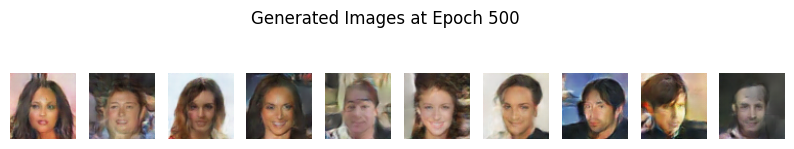

Epoch [505/1000], d_loss: 0.04616626724600792, g_loss: 4.780083179473877
Epoch [510/1000], d_loss: 0.038605041801929474, g_loss: 4.610201835632324
Epoch [515/1000], d_loss: 2.0885472297668457, g_loss: 1.2418127059936523
Epoch [520/1000], d_loss: 1.6089427471160889, g_loss: 0.8589425086975098
Epoch [525/1000], d_loss: 0.14183150231838226, g_loss: 4.612766265869141
Epoch [530/1000], d_loss: 0.0809403657913208, g_loss: 4.195282459259033
Epoch [535/1000], d_loss: 0.0615619421005249, g_loss: 4.1868438720703125
Epoch [540/1000], d_loss: 0.07372044026851654, g_loss: 4.27386474609375
Epoch [545/1000], d_loss: 0.06783115118741989, g_loss: 3.931497573852539
Epoch [550/1000], d_loss: 0.05473931506276131, g_loss: 4.361928462982178


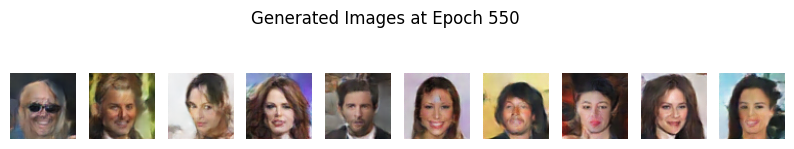

Epoch [555/1000], d_loss: 0.0983009859919548, g_loss: 4.308318138122559
Epoch [560/1000], d_loss: 0.06561090052127838, g_loss: 4.617252349853516
Epoch [565/1000], d_loss: 0.052140552550554276, g_loss: 4.634147644042969
Epoch [570/1000], d_loss: 0.04282193258404732, g_loss: 4.6534104347229
Epoch [575/1000], d_loss: 1.716643214225769, g_loss: 0.4739682972431183
Epoch [580/1000], d_loss: 1.43962562084198, g_loss: 1.4603029489517212
Epoch [585/1000], d_loss: 1.5215201377868652, g_loss: 2.258709192276001
Epoch [590/1000], d_loss: 0.9944355487823486, g_loss: 4.184241771697998
Epoch [595/1000], d_loss: 0.8782561421394348, g_loss: 3.60963773727417
Epoch [600/1000], d_loss: 0.16786077618598938, g_loss: 3.519188165664673


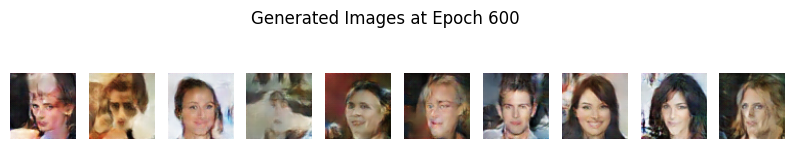

Epoch [605/1000], d_loss: 0.09917943179607391, g_loss: 4.630131244659424
Epoch [610/1000], d_loss: 0.06668132543563843, g_loss: 4.274068832397461
Epoch [615/1000], d_loss: 0.07102285325527191, g_loss: 4.103823184967041
Epoch [620/1000], d_loss: 0.057430896908044815, g_loss: 4.267254829406738
Epoch [625/1000], d_loss: 0.08928728848695755, g_loss: 5.570939064025879
Epoch [630/1000], d_loss: 0.05051637440919876, g_loss: 5.147950172424316
Epoch [635/1000], d_loss: 0.039689529687166214, g_loss: 5.118731498718262
Epoch [640/1000], d_loss: 0.0409424863755703, g_loss: 5.003408908843994
Epoch [645/1000], d_loss: 1.3816996812820435, g_loss: 0.800702691078186
Epoch [650/1000], d_loss: 1.2701431512832642, g_loss: 1.3865715265274048


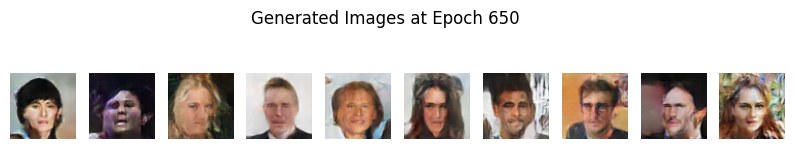

Epoch [655/1000], d_loss: 0.3539191782474518, g_loss: 3.9848713874816895
Epoch [660/1000], d_loss: 0.0649285539984703, g_loss: 4.317962646484375
Epoch [665/1000], d_loss: 0.05053882300853729, g_loss: 4.536019325256348
Epoch [670/1000], d_loss: 0.06926010549068451, g_loss: 4.116892337799072
Epoch [675/1000], d_loss: 0.04333670809864998, g_loss: 4.917076587677002
Epoch [680/1000], d_loss: 0.04023931175470352, g_loss: 4.741520404815674
Epoch [685/1000], d_loss: 0.02578766644001007, g_loss: 5.4350199699401855
Epoch [690/1000], d_loss: 0.04298248514533043, g_loss: 4.548553466796875
Epoch [695/1000], d_loss: 0.031088974326848984, g_loss: 4.850338935852051
Epoch [700/1000], d_loss: 0.03973213583230972, g_loss: 4.70153284072876


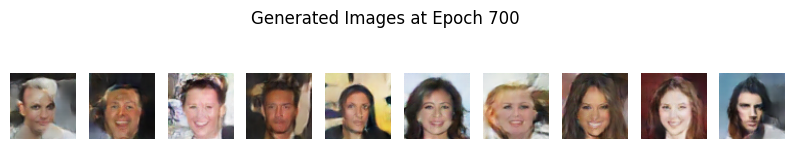

Epoch [705/1000], d_loss: 0.02582423947751522, g_loss: 5.703485488891602
Epoch [710/1000], d_loss: 0.026939064264297485, g_loss: 5.240525722503662
Epoch [715/1000], d_loss: 0.025955267250537872, g_loss: 5.344830513000488
Epoch [720/1000], d_loss: 0.012497993186116219, g_loss: 6.361327171325684
Epoch [725/1000], d_loss: 0.01991940662264824, g_loss: 5.655850887298584
Epoch [730/1000], d_loss: 1.4365921020507812, g_loss: 1.7110882997512817
Epoch [735/1000], d_loss: 1.541373372077942, g_loss: 1.2732490301132202
Epoch [740/1000], d_loss: 0.7285916209220886, g_loss: 6.021690368652344
Epoch [745/1000], d_loss: 0.25537270307540894, g_loss: 5.50881290435791
Epoch [750/1000], d_loss: 0.08287877589464188, g_loss: 4.122473239898682


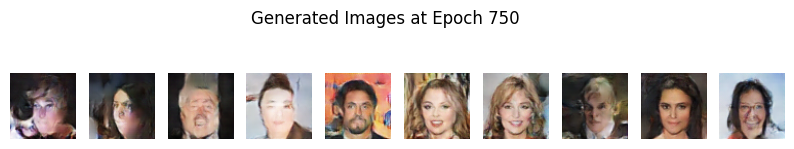

Epoch [755/1000], d_loss: 0.06779830157756805, g_loss: 4.361600875854492
Epoch [760/1000], d_loss: 0.031065065413713455, g_loss: 5.409056663513184
Epoch [765/1000], d_loss: 0.03513884171843529, g_loss: 4.996996879577637
Epoch [770/1000], d_loss: 0.035437338054180145, g_loss: 4.963451862335205
Epoch [775/1000], d_loss: 0.04711873084306717, g_loss: 4.5536394119262695
Epoch [780/1000], d_loss: 0.028210550546646118, g_loss: 4.968153953552246
Epoch [785/1000], d_loss: 0.030716221779584885, g_loss: 4.732134819030762
Epoch [790/1000], d_loss: 0.02505502849817276, g_loss: 5.208186626434326
Epoch [795/1000], d_loss: 0.022882310673594475, g_loss: 5.184739589691162
Epoch [800/1000], d_loss: 0.016156308352947235, g_loss: 5.919083595275879


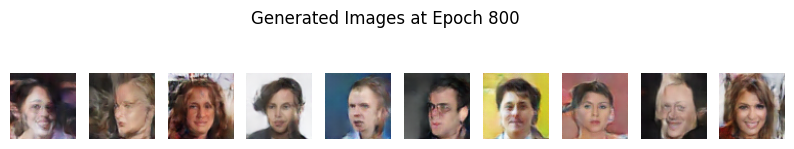

Epoch [805/1000], d_loss: 0.029206108301877975, g_loss: 5.032975196838379
Epoch [810/1000], d_loss: 0.0216066837310791, g_loss: 5.775082588195801
Epoch [815/1000], d_loss: 0.019821956753730774, g_loss: 5.508623123168945
Epoch [820/1000], d_loss: 0.010992307215929031, g_loss: 5.998724460601807
Epoch [825/1000], d_loss: 0.02381264418363571, g_loss: 5.147074222564697
Epoch [830/1000], d_loss: 0.022317929193377495, g_loss: 6.492645740509033
Epoch [835/1000], d_loss: 0.015321165323257446, g_loss: 5.989720344543457
Epoch [840/1000], d_loss: 1.2035796642303467, g_loss: 0.8922116160392761
Epoch [845/1000], d_loss: 1.1791877746582031, g_loss: 1.2361658811569214
Epoch [850/1000], d_loss: 1.392293930053711, g_loss: 2.6771459579467773


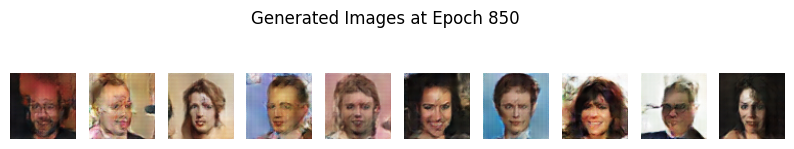

Epoch [855/1000], d_loss: 3.0573227405548096, g_loss: 1.6894389390945435
Epoch [860/1000], d_loss: 1.100239872932434, g_loss: 2.1639060974121094
Epoch [865/1000], d_loss: 0.3321852684020996, g_loss: 4.838629245758057
Epoch [870/1000], d_loss: 0.26938068866729736, g_loss: 4.051755905151367
Epoch [875/1000], d_loss: 0.09949726611375809, g_loss: 4.8059773445129395
Epoch [880/1000], d_loss: 0.10161404311656952, g_loss: 3.8969061374664307
Epoch [885/1000], d_loss: 0.041289232671260834, g_loss: 5.152211666107178
Epoch [890/1000], d_loss: 0.04127844423055649, g_loss: 4.957059383392334
Epoch [895/1000], d_loss: 0.032286807894706726, g_loss: 5.327436447143555
Epoch [900/1000], d_loss: 0.04484120011329651, g_loss: 4.933276176452637


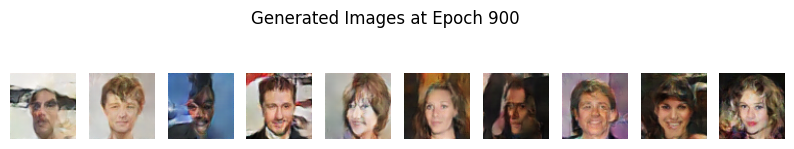

Epoch [905/1000], d_loss: 0.04188651219010353, g_loss: 5.35753059387207
Epoch [910/1000], d_loss: 0.029789377003908157, g_loss: 5.42327356338501
Epoch [915/1000], d_loss: 0.018474597483873367, g_loss: 5.657777786254883
Epoch [920/1000], d_loss: 0.9295838475227356, g_loss: 2.141780138015747
Epoch [925/1000], d_loss: 0.05935268849134445, g_loss: 5.840031623840332
Epoch [930/1000], d_loss: 0.033494897186756134, g_loss: 5.130866527557373
Epoch [935/1000], d_loss: 0.040504515171051025, g_loss: 4.930508613586426
Epoch [940/1000], d_loss: 0.03659992665052414, g_loss: 5.4188385009765625
Epoch [945/1000], d_loss: 0.021447261795401573, g_loss: 5.820026874542236
Epoch [950/1000], d_loss: 0.26774877309799194, g_loss: 5.039615154266357


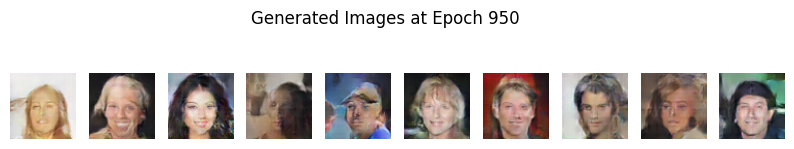

Epoch [955/1000], d_loss: 0.019394874572753906, g_loss: 5.798369407653809
Epoch [960/1000], d_loss: 0.02892313152551651, g_loss: 5.197140693664551
Epoch [965/1000], d_loss: 0.020443791523575783, g_loss: 5.847690582275391
Epoch [970/1000], d_loss: 0.023600498214364052, g_loss: 5.487706661224365
Epoch [975/1000], d_loss: 0.01413675956428051, g_loss: 5.95838737487793
Epoch [980/1000], d_loss: 0.020649578422307968, g_loss: 5.725611209869385
Epoch [985/1000], d_loss: 0.01207820326089859, g_loss: 6.399364471435547
Epoch [990/1000], d_loss: 0.0073790596798062325, g_loss: 6.348334312438965
Epoch [995/1000], d_loss: 0.01308734156191349, g_loss: 6.788132190704346
Epoch [1000/1000], d_loss: 0.009488869458436966, g_loss: 6.435943126678467


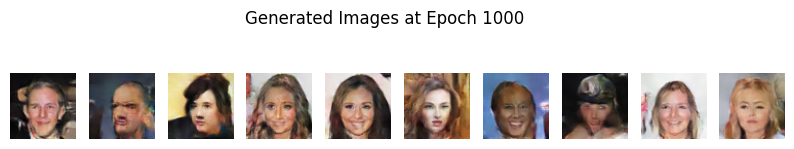

In [12]:
 # Crear instancias del generador y del discriminador
generator = Generator(latent_dim=100).to(device)
discriminator = Discriminator().to(device)

# Aplicar la inicialización de pesos
generator.apply(init_normal)
discriminator.apply(init_normal)

# Función de pérdida y optimizadores
criterion = nn.BCELoss()
optimizer_g = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_d = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
z_dim = 100
# Bucle de entrenamiento
epochs = 1000
for epoch in range(epochs):
    for i, (images, _) in enumerate(data_loader):
        # Tamaño del lote y etiquetas reales/falsas
        real_images = images.to(device)
        batch_size = real_images.size(0)

        real_labels = torch.ones(batch_size, 1, device=device)
        fake_labels = torch.zeros(batch_size, 1, device=device)

        # ===== Entrenamiento del Discriminador =====
        discriminator.zero_grad()

        outputs_real = discriminator(real_images).view(-1, 1)
        loss_real = criterion(outputs_real, real_labels)
        loss_real.backward()

        # Entrenar el discriminador con imágenes falsas
        z = torch.randn(batch_size, 100, 1, 1, device=device)
        fake_images = generator(z)
        outputs_fake = discriminator(fake_images.detach()).view(-1, 1)
        loss_fake = criterion(outputs_fake, fake_labels)
        loss_fake.backward()

        # Actualizar el discriminador
        optimizer_d.step()

        # Entrenar el generador
        generator.zero_grad()
        outputs = discriminator(fake_images).view(-1, 1)
        loss_g = criterion(outputs, real_labels)
        loss_g.backward()
        optimizer_g.step()

        # Imprimir estadísticas y visualizar resultados
    if (epoch + 1) % 5 == 0:
      print(f'Epoch [{epoch + 1}/{epochs}], d_loss: {(loss_real + loss_fake).item()}, g_loss: {loss_g.item()}')
    with torch.no_grad():
        if (epoch + 1) % 50 == 0 or epoch == 0:
          show_generated_images(epoch, generator, z_dim=z_dim, num_images=10, image_size=64)

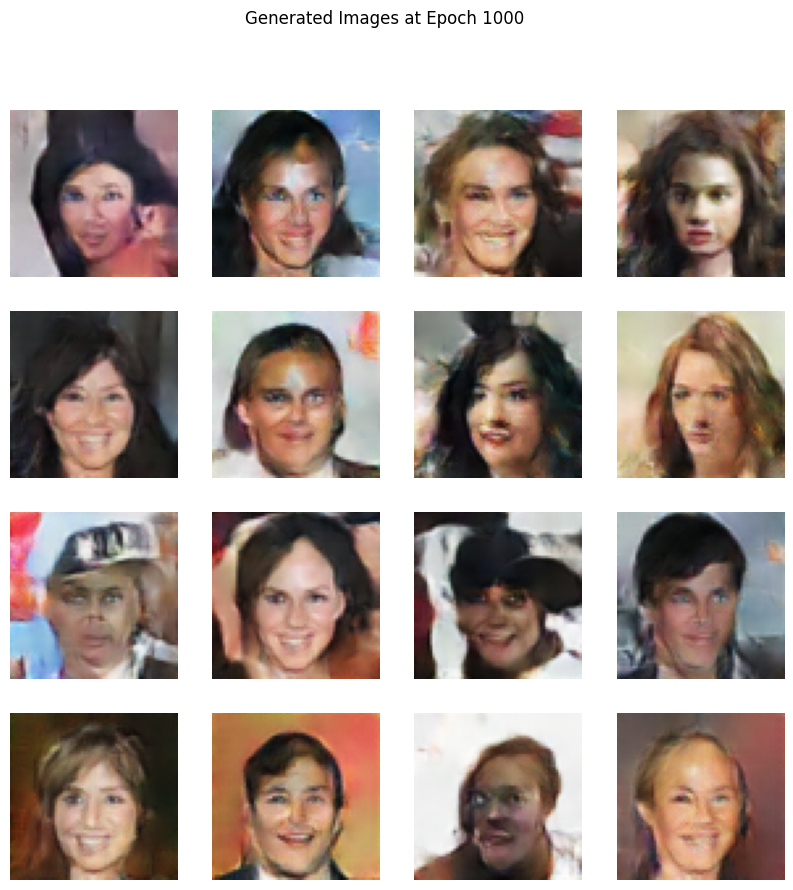

In [16]:
import math
import matplotlib.pyplot as plt
import numpy as np
import torch

def show_generated_images_grid(epoch, generator, z_dim, num_images=16, image_size=64):
    grid_size = int(math.sqrt(num_images))
    if grid_size * grid_size != num_images:
        raise ValueError("num_images debe ser un cuadrado perfecto para una grilla simétrica.")

    z = torch.randn(num_images, z_dim, 1, 1).to(device)
    with torch.no_grad():
        fake_images = generator(z)
        fake_images = fake_images.view(-1, 3, image_size, image_size)
        fake_images = (fake_images.cpu().data.numpy() + 1) / 2.0
        fake_images = np.transpose(fake_images, (0, 2, 3, 1))

    plt.figure(figsize=(10, 10))
    for i in range(num_images):
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(fake_images[i])
        plt.axis('off')
    plt.suptitle(f'Generated Images at Epoch {epoch + 1}')
    plt.show()

# Uso de la función
show_generated_images_grid(epoch, generator, z_dim=z_dim, num_images=16, image_size=64)



In [ ]:
show_generated_images(epoch, generator, z_dim=z_dim, num_images=50, image_size=64)

# Conclusión

Esta introducción al mundo de las GANs sirvio como punto de entrada para comprender mejor de que se tratan los modelos generativos, para tener una experiencia de primera mano.

Trabajando  con datasets variados - MNIST, Fashion MNIST, CIFAR10 y CelebA - me di cuenta y puede encarar el desafío de adaptar y comprender distintas arquitecturas, desde las más sencillas basadas en MLP hasta las mas complejas y profundadas como en las DCGANs.

1. MNIST: GAN y DCGAN

Comencé con el dataset MNIST, utilizando una arquitectura básica de MLP. Esto fue clave para entender como es que interactuan el generador y el discriminador en una GAN. MNIST, con sus imágenes simples, fue sencillo como problema aunque se noto que con MLP le costaba muchisimo mas generar buenos resultados que los que genero luego con DCGAN para este mismo conjunto de datos, debido a que DCGAN incluye redes convolucionales que esta probado que funcionan mucho mejor en el dominio de las imágenes.

2. Incrementando la Complejidad: Fashion MNIST y CIFAR10:

Usando datasets mas complejos como Fashion MNIST y CIFAR10, una conclusión es que con las GANs con MLP no me fue posible generar buenos resultados y tuve que pasar si o si a las DCGANs, que tienen capas convolucionales. Esto permite manejar las características más sofisticadas de las imágenes, lo que permite generar resultados mucho mas realistas y detallados.

3. El Reto de las Imágenes de Alta Resolución: CelebA:

El dataset CelebA fue el desafio mas grande ya que hasta el hecho de encontrar y descargar el dataset me fue complejo. Para este dataset la capacidad de las DCGANs para procesar detalles finos y complejidades sutiles es fundamental. Fue realmente impresionante ver como estas redes son capaces de generar rostros humanos realistas. Aunque solo se uso un dataset de 5000 imágenes con lo cual no se uso el dominio completo de imágenes disponibles y solo 100 epochs, se nota que dada un periodo de entrenamiento mas largo podrían generar resultados verdaderamente difíciles de distinguir entre verdadero y falso.

4. Arquitectura y del juego Minimax:

La dinamica de minimax entre el generador y el discriminador en las GANs es evidente durante las pruebas que hice. Pude observar como el generador mejoraba gradualmente en la creación de imágenes falsas, mientras que el discriminador aumentaba su habilidad para discernir entre imágenes reales y falsas.

También es evidente lo importante que es esta interacción entre las redes para convertir un problema no supervisado en un supervisado.

Algo que pude investigar e implementar fue la inicialización de pesos, que segun la bibliografía leída y la experiencia en este proyecto es muy importante para el buen funcionamiento de las GANs.

4. Conclusiones finales:

A lo largo de este proyecto, me di cuenta lo crucial que es la elección de arquitectura de las redes y que debe adaptarse al tipo de datos con los que uno trabaja. Mientras que para datos simples una GAN básica con MLP puede ser suficiente, las DCGANs se vuelven esenciales cuando los datos son más complejos y detallados.

Este proyecto me permitió no solo entender la teoría detras de las GANs y DCGANs, sino también de su aplicación e implementación. Las posibilidades de las GANs para crear nuevos datos realistas me resultaron super emocionantes.